# Capstone Project 

# Buying a home in Germany - Categorical geospatial study

### Applied Data Science Capstone by IBM/Coursera

## Table of contents <a name="top"></a>
1. [Introduction: Business Problem](#introduction)
2. [Data](#data)
3. [Methodology](#methodology)
4. [Analysis](#analysis)
5. [Results](#results)
6. [Discussion](#discussion)
7. [Conclusion](#conclusion)

## 1. Introduction: Business Problem <a name="introduction"></a>

In Germany only about 45 percent of households own their main residence. This is the second lowest number among all OECD countries, undercut only by Switzerland. This is driven by housing policies that produce incentives to rent.

Nonetheless buying a home can be a good investment, especially if you are planning to take advantage of good market conditions.
One of the most important and impactful decisions to make, when choosing to buy a home, is the location. The key factors of a great location are accessibility, appearance, and amenities available in a neighborhood. 

These factors greatly influence the buying price, location desirability and investment value appreciation over time.

Considering the amenities available in a neighborhood, these translate directly to a better living and quality of life, for example: consider not having to travel far to go to a doctor’s appointment, doing your shopping or dining or getting food in a good restaurant near your house, these are some of the hallmarks of a great neighborhood.

Here lies **our problem**, regarding the **availability of amenities in a neighborhood**, where should you choose to live? What makes a great neighborhood, and which are the best neighborhoods with the most amenities available to purchase a house.

This project is about studying the amenities availability when location choosing to buy a house around the **Bad Homburg vor der Höhe** city.

Our final objective is clustering and comparing areas to try to find and group the best places to live. 

We will use exploratory data analysis, data visualization and machine learning algorithms to study this problem.

**Before continuing I would like to make a *caveat*, this work will be conducted in English, but the main data was collected on German websites, so some translations might not be up to par, we are sorry for that.**

In [1]:
from IPython.display import HTML

In [2]:
HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').show();
 } else {
 $('div.input').hide();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
The raw code for this IPython notebook is by default hidden for easier reading.
To toggle on/off the raw code, click <a href="javascript:code_toggle()">here</a>.''')

[To Table of Contents](#top)

## **2. Data**<a name="data"></a>

We will use the following data:

**1. Locations Coordinates ( Latitude and Longitude )**

One of the most important steps in our project was choosing the area on which we would do our study, finally we decided to **study all the cities within a ~20 kilometer radius from Bad Homburg vor der Höhe and all of Frankfurt am Main**. 

This posed a problem, since our study is based on latitude and longitude coordinates, the larger area cities would be underrepresented.

In order to try to solve the aforementioned problem we decided on using postal codes for the larger cities such as Bad Homburg vor der Höhe, Frankfurt am Main and Offenbach am Main, this was further supported by seeing that the smaller cities would usually only have one postal code.

**2  - Amenities available in the defined area**

After we define the coordinates of the chosen locations, we need to get all the relevant information about the amenities around the coordinates. The relevant information is: amenity name, amenity latitude, amenity longitude, amenity category. 

**Data collection**

We used the https://www.suche-postleitzahl.org/ website to search all cities within the defined radius afterwards we built a excel file with info **( postal code, name, area, region, residents)**, to support our analysis.

To get the **coordinates (latitude and longitude)** we used the Nominatim API to access the OpenStreetMap database https://www.openstreetmap.org/.

To get the amenities data **(amenity name, amenity latitude, amenity longitude, amenity category)** we used the free tier of Foursquare Developer API https://developer.foursquare.com/.

**First let's read and explore the excel file with our initial location data.**

In [3]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import folium

%matplotlib inline

mpl.style.use('ggplot') # optional: for ggplot-like style


pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

df = pd.read_excel("data\cities_ag.xlsx", sheet_name="Folha1")

df.head()

,PLZ,Ortsteile,Ort,Landkreis,einwohner
0,65520,Bad Camberg,Bad Camberg,Landkreis Limburg-Weilburg,13931
1,61348,Bad Homburg vor der Höhe,Bad Homburg vor der Höhe,Hochtaunuskreis,13333
2,61352,Bad Homburg vor der Höhe,Bad Homburg vor der Höhe,Hochtaunuskreis,16594
3,61350,Bad Homburg vor der Höhe,Bad Homburg vor der Höhe,Hochtaunuskreis,21470
4,61231,Bad Nauheim,Bad Nauheim,Wetteraukreis,30209


For clarity a brief explanation of the columns names is in order: 

PLZ - Postal code 

Ortsteile - city district ( in the larger cities in accordance to the source, some postal codes represent several districts)

Ort - municipality

Landkreis - administrative district

einwohner - Residents (Based on 2011 census)


These columns are not without problems, particularly the second and third rows which are important for our work. In both columns there are duplicates and in the second column Ortsteile there are very big names that we couldn't clearly classify so we used all the available information, these names are not user friendly for visualization.

### **Data cleaning and transformation**

**Now let's check to see if our data needs some cleaning and transformation, beginning by describing all variables and the correspondent types**

In [4]:
df.describe(include='all')

,PLZ,Ortsteile,Ort,Landkreis,einwohner
count,96.000000,96,96,96,96.000000
unique,NaN,90,51,9,NaN
top,NaN,Bad Homburg vor der Höhe,Frankfurt am Main,kreisfreie Stadt,NaN
freq,NaN,3,39,48,NaN
mean,61807.239583,NaN,NaN,NaN,16720.812500
std,3409.574441,NaN,NaN,NaN,9472.599752
min,35510.000000,NaN,NaN,NaN,0.000000
25%,60436.500000,NaN,NaN,NaN,9295.000000
50%,61204.500000,NaN,NaN,NaN,15895.500000
75%,63097.500000,NaN,NaN,NaN,21649.250000


In [5]:
print(df.shape)
df.dtypes

(96, 5)


PLZ           int64
Ortsteile    object
Ort          object
Landkreis    object
einwohner     int64
dtype: object

We have 96 rows and 5 columns and no null values. Since the PLZ column isn't supposed to be numeric, we will change the column's type to string.

In [6]:
#change PLZ to string
df['PLZ'] = df['PLZ'].astype(str)

df.dtypes

PLZ          object
Ortsteile    object
Ort          object
Landkreis    object
einwohner     int64
dtype: object

**Checking and visualizing any missing data from our dataset**

<AxesSubplot:>

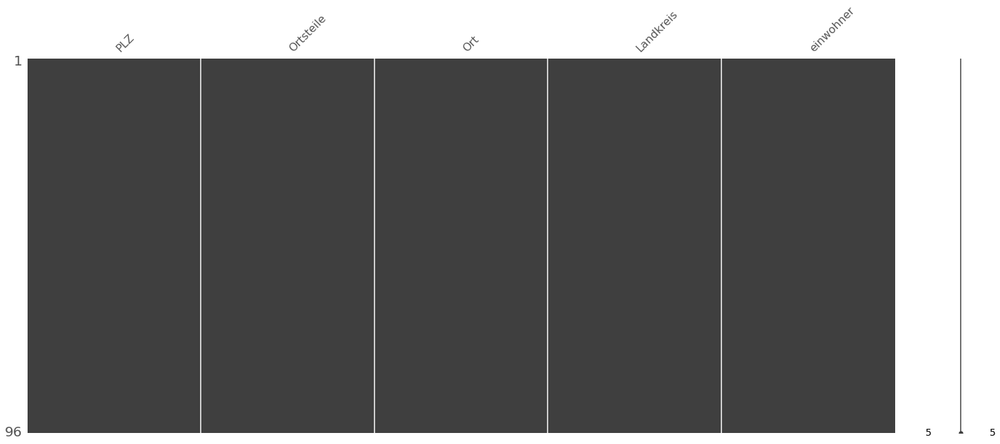

In [7]:
import missingno as msno

msno.matrix(df)

These solid bars mean that missing data isn't a problem.

**Let's explore in detail the residents (einwohner) column**

In [8]:
#describe numeric variable
df[['einwohner']].describe().round(decimals=2)

,einwohner
count,96.00
mean,16720.81
std,9472.60
min,0.00
25%,9295.00
50%,15895.50
75%,21649.25
max,44125.00


As we can see in our 96 areas the average residents number is 16720 with a standard deviation of 9472,60. The minimum value is 0 and the maximum is 44125.

**Drawing the variable histogram**

array([[<AxesSubplot:title={'center':'einwohner'}>]], dtype=object)

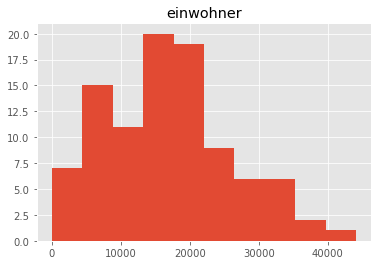

In [9]:
ein_hist = df[['einwohner']]
ein_hist.hist()

**Ordering the number of residents by area in descending order**

In [10]:
grouped_df = df.groupby(by=["PLZ","Ortsteile", 'Ort'], dropna=False).sum()
grouped_df.sort_values(['einwohner'],ascending=False)

,,,einwohner
PLZ,Ortsteile,Ort,
61440,Oberursel (Taunus),Oberursel,44125
65719,Hofheim am Taunus,Hofheim am Taunus,37735
63477,Maintal,Maintal,35827
60439,"Heddernheim, Kalbach-Riedberg, Niederursel, Praunheim",Frankfurt am Main,35056
63263,Neu-Isenburg,Neu-Isenburg,34716
65510,"Idstein, Hünstetten","Idstein, Hünstetten",33269
60385,"Bornheim, Nordend-Ost, Ostend",Frankfurt am Main,33049
61118,Bad Vilbel,Bad Vilbel,31268
60437,"Bonames, Harheim, Kalbach-Riedberg, Nieder-Erlenbach, Nieder-Eschbach, Niederursel",Frankfurt am Main,31230


Accordingly to our data the area with most residents is Oberusel and the least populated area with only 12 residents is the Flughafen area in Frankfurt am Main ( not considering areas with 0 residents).

According to the table above Oberusel is the area with the most residents, now let's see the aggregate data by municipality (ort)

In [11]:
sum_res = df.groupby(['Ort'])['einwohner'].sum().to_frame()
sum_res.sort_values(['einwohner'],ascending=False)

,einwohner
Ort,
Frankfurt am Main,668287
Offenbach am Main,113241
Bad Homburg vor der Höhe,51397
Oberursel,44125
Hofheim am Taunus,37735
Maintal,35827
Neu-Isenburg,34716
"Idstein, Hünstetten",33269
Bad Vilbel,31268


As expected, Frankfurt am Main is at the top of this table.

In [12]:
print("Total number of residents:", df['einwohner'].sum())

Total number of residents: 1605198


**Everything's better with a graph: Residents (eihnwohner)**

In [13]:
graph_df = df[['PLZ','Ort','einwohner']].copy()

In [14]:
#create a new column
graph_df['PLZ_Ort'] = graph_df[['PLZ', 'Ort']].agg(' '.join, axis=1)
graph_df.drop(['PLZ','Ort'], axis=1, inplace=True)

#let's move the new column
fixed_columns = [graph_df.columns[-1]] + list(graph_df.columns[:-1])
graph_df = graph_df[fixed_columns]

#set index new column
graph_df.set_index('PLZ_Ort', inplace=True)

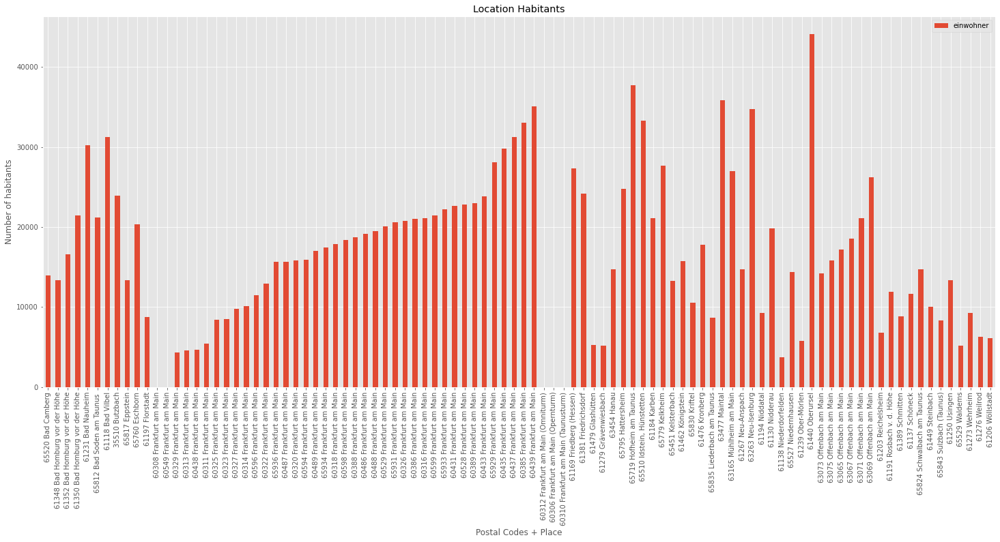

In [15]:
graph_df.plot(kind='bar',
             figsize=(25, 10))

plt.title('Location Habitants')
plt.ylabel('Number of habitants')
plt.xlabel('Postal Codes + Place')

plt.show()

From the analysis we reach the conclusion that there are areas where we don't have inhabitants, so we decided that we will drop the correspondent rows. 

We will drop all places which have less than 100 inhabitants, this number is arbitrarily defined to exclude low density areas which will probably have fewer amenities to study and where it should be impossible to purchase a home.

In [16]:
#let's drop all rows with less than 100 persons
print("Old dataset: ",df.shape)
df.drop(df.loc[df['einwohner']<100].index, inplace=True)
print("New dataset: ",df.shape)

Old dataset:  (96, 5)
New dataset:  (91, 5)


**Finally let's enumerate the areas our study**

In [17]:
df.groupby(['Ort'])['PLZ'].count().to_frame()

,PLZ
Ort,
Bad Camberg,1
Bad Homburg vor der Höhe,3
Bad Nauheim,1
Bad Soden am Taunus,1
Bad Vilbel,1
Butzbach,1
Eppstein,1
Eschborn,1
Florstadt,1


From the table above our study will focus in:

1. 45 City centers 
2. 37 Frankfurt am Main postal codes areas
3. 06 Offenbach am Main postal codes areas
4. 03 Bad Homburg vor der Höhe postal codes areas 


**Total of 91 areas to search for amenities**

In [18]:
#create a copy
am_df = df.copy()

**Getting the coordinates latitude and longitude for the studied areas**

After some cleaning it's time to get the coordinates.

For this purpose, we are going to use the Nominatim api and access the Openstreetmap database.

We will find latitude and longitude for each city center and postal code area (Frankfurt am Main, Bad Homburg vor der Höhe and Offenbach am Main).

In [19]:
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter

geocoder = Nominatim(user_agent="hg_explorer")
geocode = RateLimiter(geocoder.geocode, min_delay_seconds = 1,   return_value_on_exception = None)

def custom_geocoder(postal,local):
    if(local in ['Frankfurt am Main', 'Bad Homburg vor der Höhe', 'Offenbach am Main']):
        address1 = str(postal) + " Deutschland"
        location = geocode(address1)    
    else:
        address1 = str(local) + ", Hessen"
        location = geocode(address1)
    return pd.Series({'Latitude': location.latitude, 'Longitude': location.longitude})

# Try to load from local file system in case we did this before
loaded = False
try:
    am_df = pd.read_pickle('./data/locations.pkl')
    loaded = True
    print("Just loaded stored pickle!")
except:
    pass

if not loaded:
    am_df[['latitude' , 'longitude']] = am_df[['PLZ','Ort']].apply(lambda x: custom_geocoder(x['PLZ'], x['Ort']), axis=1)
    print("Just had to get the coordinates data and i'll store it for later usage")
    am_df.to_pickle('./data/locations.pkl')

Just loaded stored pickle!


Let's see what we got!

In [20]:
am_df.head(10)

,PLZ,Ortsteile,Ort,Landkreis,einwohner,latitude,longitude
0,65520,Bad Camberg,Bad Camberg,Landkreis Limburg-Weilburg,13931,50.299603,8.267312
1,61348,Bad Homburg vor der Höhe,Bad Homburg vor der Höhe,Hochtaunuskreis,13333,50.226423,8.611368
2,61352,Bad Homburg vor der Höhe,Bad Homburg vor der Höhe,Hochtaunuskreis,16594,50.221324,8.653160
3,61350,Bad Homburg vor der Höhe,Bad Homburg vor der Höhe,Hochtaunuskreis,21470,50.239388,8.600062
4,61231,Bad Nauheim,Bad Nauheim,Wetteraukreis,30209,50.368111,8.747361
5,65812,Bad Soden am Taunus,Bad Soden am Taunus,Main-Taunus-Kreis,21203,50.142914,8.502926
6,61118,Bad Vilbel,Bad Vilbel,Wetteraukreis,31268,50.180484,8.741078
7,35510,Butzbach,Butzbach,Wetteraukreis,23912,50.434042,8.671118
8,65817,Eppstein,Eppstein,Main-Taunus-Kreis,13327,50.140341,8.394293
9,65760,Eschborn,Eschborn,Main-Taunus-Kreis,20317,50.142642,8.571627


Next, we are going to explore the distance between the different points we collected by creating a distance matrix, a cool way to quickly check the distances between areas.

For this distance matrix we will be using the haversine (or great circle) distance which is the angular distance between two points on the surface of a sphere.

In [21]:
#distance matrix
from sklearn.neighbors import DistanceMetric
from math import radians

matrix = am_df[['PLZ', 'Ort','latitude','longitude']].copy()

In [22]:
#I don't like repeating code but for now it'll do
#create a new column
matrix['PLZ_Ort'] = matrix[['PLZ', 'Ort']].agg(' '.join, axis=1)
matrix.drop(['PLZ','Ort'], axis=1, inplace=True)

#let's move the new column
fixed_columns = [matrix.columns[-1]] + list(matrix.columns[:-1])
matrix = matrix[fixed_columns]

In [23]:
matrix['latitude'] = np.radians(matrix['latitude'])
matrix['longitude'] = np.radians(matrix['longitude'])

In [24]:
dist = DistanceMetric.get_metric('haversine')

In [25]:
pd.DataFrame(dist.pairwise(matrix[['latitude','longitude']].to_numpy())*6371,  columns=matrix.PLZ_Ort.unique(), index=matrix.PLZ_Ort.unique()).round(decimals=2)

,65520 Bad Camberg,61348 Bad Homburg vor der Höhe,61352 Bad Homburg vor der Höhe,61350 Bad Homburg vor der Höhe,61231 Bad Nauheim,65812 Bad Soden am Taunus,61118 Bad Vilbel,35510 Butzbach,65817 Eppstein,65760 Eschborn,61197 Florstadt,60329 Frankfurt am Main,60313 Frankfurt am Main,60438 Frankfurt am Main,60311 Frankfurt am Main,60325 Frankfurt am Main,60323 Frankfurt am Main,60327 Frankfurt am Main,60314 Frankfurt am Main,60596 Frankfurt am Main,60322 Frankfurt am Main,65936 Frankfurt am Main,60487 Frankfurt am Main,60320 Frankfurt am Main,60594 Frankfurt am Main,60489 Frankfurt am Main,65934 Frankfurt am Main,60318 Frankfurt am Main,60598 Frankfurt am Main,60388 Frankfurt am Main,60486 Frankfurt am Main,60488 Frankfurt am Main,60529 Frankfurt am Main,65931 Frankfurt am Main,60326 Frankfurt am Main,60386 Frankfurt am Main,60316 Frankfurt am Main,60599 Frankfurt am Main,65933 Frankfurt am Main,60431 Frankfurt am Main,60528 Frankfurt am Main,60389 Frankfurt am Main,60433 Frankfurt am Main,65929 Frankfurt am Main,60435 Frankfurt am Main,60437 Frankfurt am Main,60385 Frankfurt am Main,60439 Frankfurt am Main,61169 Friedberg (Hessen),61381 Friedrichsdorf,61479 Glashütten,61279 Grävenwiesbach,63454 Hanau,65795 Hattersheim,65719 Hofheim am Taunus,"65510 Idstein, Hünstetten",61184 Karben,65779 Kelkheim,65451 Kelsterbach,61462 Königstein,65830 Kriftel,61476 Kronberg,65835 Liederbach am Taunus,63477 Maintal,63165 Mühlheim am Main,61267 Neu-Anspach,63263 Neu-Isenburg,61194 Niddatal,61130 Nidderau,61138 Niederdorfelden,65527 Niedernhausen,61239 Ober-Mörlen,61440 Oberursel,63073 Offenbach am Main,63075 Offenbach am Main,63065 Offenbach am Main,63067 Offenbach am Main,63071 Offenbach am Main,63069 Offenbach am Main,61203 Reichelsheim,61191 Rosbach v. d. Höhe,61389 Schmitten,61137 Schöneck,65824 Schwalbach am Taunus,61449 Steinbach,65843 Sulzbach (Taunus),61250 Usingen,65529 Waldems,61273 Wehrheim,61276 Weilrod,61206 Wöllstadt
65520 Bad Camberg,0.00,25.77,28.78,24.58,34.91,24.18,36.20,32.31,19.88,27.81,42.52,35.54,35.96,29.23,36.26,34.63,34.54,34.99,37.84,36.62,34.97,29.13,32.93,33.90,37.05,31.09,30.98,35.58,37.58,38.36,33.26,30.38,33.28,28.69,33.86,39.67,36.45,38.86,32.63,32.45,36.00,36.35,32.47,28.90,34.22,31.37,37.03,30.32,34.78,27.71,13.41,16.61,49.77,29.68,26.93,3.49,36.65,22.30,32.07,19.22,27.91,21.73,25.13,44.08,46.41,17.23,40.85,40.25,43.99,39.86,15.77,31.25,24.84,45.12,42.40,41.67,40.61,43.11,42.09,39.87,30.50,12.99,41.58,25.43,26.21,26.24,19.53,8.07,21.42,11.25,35.69
61348 Bad Homburg vor der Höhe,25.77,0.00,3.03,1.65,18.48,12.08,10.55,23.47,18.18,9.74,20.69,13.80,13.36,5.53,13.78,12.82,12.24,13.92,14.45,15.00,12.17,12.19,11.42,10.65,14.69,11.26,14.01,12.48,15.96,13.18,12.38,9.44,15.90,16.88,13.84,15.08,13.22,16.15,14.27,9.49,16.04,12.13,8.39,14.18,9.83,5.93,13.28,7.51,15.78,4.31,14.91,20.92,24.08,19.33,19.45,27.89,11.42,15.05,18.85,11.52,18.65,8.98,14.47,18.51,21.31,11.12,19.96,17.00,18.84,14.10,22.13,17.26,3.62,20.85,17.49,17.54,16.69,19.06,18.54,21.11,10.10,12.83,15.96,10.16,7.14,12.00,13.10,17.79,9.00,18.24,13.42
61352 Bad Homburg vor der Höhe,28.78,3.03,0.00,4.28,17.64,13.80,7.73,23.69,20.51,10.50,18.48,12.70,11.97,4.99,12.42,11.79,11.08,13.04,12.68,13.84,10.82,12.79,10.68,9.26,13.30,11.15,14.32,10.97,14.73,10.64,11.74,9.27,15.89,17.95,13.31,12.78,11.60,14.54,14.18,8.40,15.32,10.14,6.86,15.01,7.93,3.60,11.43,6.91,14.55,3.82,17.84,23.06,21.16,20.41,20.97,30.91,8.51,17.09,19.47,14.07,19.97,11.29,16.06,15.68,18.67,13.61,18.71,14.55,15.89,11.09,24.80,17.06,5.67,18.52,14.98,15.35,14.61,16.86,16.53,19.58,9.18,15.81,12.94,11.60,8.33,13.30,15.03,20.81,10.85,20.92,11.43
61350 Bad Homburg vor der Höhe,24.58,1.65,4.28,0.00,17.73,12.76,11.98,22.22,18.33,10.95,20.75,15.42,15.00,7.14,15.42,14.43,13.86,15.51,16.10,16.62,13.81,13.42,13.00,12.29,16.33,12.71,15.31,14.13,17.59,14.73,13.94,10.94,17.29,17.85,15.37,16.69,14.87,17.80,15.69,11.12,17.60,13.77,10.04,15.29,11.47,7.49,14.93,9.10,15.27,4.06,14.30,19.27,25.44,20.28,20.18,26.82,12.25,15.47,

This distance matrix, calculated with the haversine formula, show us the shortest distance in kilometers between two points on a sphere (Earth) using their latitudes and longitudes measured along the surface. It is important for use in navigation.

As stated before we decided to study areas within a radius of ~20 kilometers of **Bad Homburg vor der Höhe (postal code: 61348)**, but the distance matrix tells us that there are distances greater than 20km, this merits an explanation.

When we were considering the coordinates to study, we first used only postal codes, but we noticed that for some areas particularly the ones where we got one city/one postal code, the postal code coordinates would be far from the city center, and so we would get fewer amenities results. So in order to have a better sense of amenities available we decided that for areas corresponding to one city/one postal code we would get the city center coordinates and this explains why the "61348 Bad Homburg vor der Höhe" distances column are not all under 20 kilometers. The difference in distance may be further explained by the usage of the haversine formula itself since usually the distance is calculated in a straight line.

**Now let's see our areas of study in a map**

In [26]:
#helper function to get center coordinates from a set of coordinates
def get_center_latlong(df, latColName,lonColName):
    # get the center of my map for plotting
    centerlat = (df[latColName].max() + df[latColName].min()) / 2
    centerlong = (df[lonColName].max() + df[lonColName].min()) / 2
    return centerlat, centerlong

In [27]:
center = get_center_latlong(am_df,'latitude','longitude')

In [28]:
map_target = folium.Map(location=center, zoom_start=10, tiles="Stamen Toner")

# add markers to map
for lat, lng, ort, orts, plz in zip(am_df['latitude'], am_df['longitude'], am_df['Ort'], am_df['Ortsteile'], am_df['PLZ']):
    if(ort in ['Frankfurt am Main', 'Offenbach am Main']):
        label = '{}, {}, {}'.format(ort, orts, plz)
        label = folium.Popup(label, parse_html=True)
        folium.Circle([lat, lng],
                      radius=500,
                      popup=label,
                      color='red',
                      fill=True,
                      fill_color='#f73447',
                      fill_opacity=0.7,
                      parse_html=False).add_to(map_target)
    else:
        label = '{}, {}, {}'.format(ort, orts, plz)
        label = folium.Popup(label, parse_html=True)
        folium.Circle([lat, lng],
                      radius=1000,
                      popup=label,
                      color='blue',
                      fill=True,
                      fill_color='#3186cc',
                      fill_opacity=0.7,
                      parse_html=False).add_to(map_target)

map_target

Click in the area in the map to get more information

In the map above we can see all areas involved in this study. Here you can see blue and red circles, these circles represent the individual areas where we will search for amenities. **A blue circle area is 1000 meters and the red circle area is 500 meters**. 

**Why did we choose to make this distinction?** Because comparing a small city to a big city it's not feasible, the difference in amenities density would be too big. 

So, we decided that for this study, for clarity and to try to diminish overlapping/difference between areas, particularly in Frankfurt am Main and in Offenbach am Main, we would have to different radius, hence 500 and 1000 meters.

We will tolerate some overlapping because we want to find the places with the most amenities available and if it is within the radius of the area we will keep it.

**Amenities data: Using the Foursquare API let's collect data!**

Let's get the amenities data from the **Foursquare API**

In [29]:
#open file and read credentials
f=open("./data/foursquare_cred.txt","r")
lines=f.readlines()
clientId=lines[1].rstrip("\n")
clientSecret=lines[3].rstrip("\n")
f.close()

In [30]:
CLIENT_ID = clientId # your Foursquare ID
CLIENT_SECRET = clientSecret # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentials were uploaded!')

Your credentials were uploaded!


In [31]:
import requests

def getNearbyAmenities(postal,names, latitudes, longitudes):    
    venues_list=[]
    for postal, name, lat, lng in zip(postal, names, latitudes, longitudes):
        if(name in ['Frankfurt am Main', 'Offenbach am Main']):
            radius = 500
            

            # create the API request URL
            url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
                CLIENT_ID, 
                CLIENT_SECRET, 
                VERSION, 
                lat, 
                lng, 
                radius, 
                LIMIT)
            
            #print("{} and {}".format(name, radius))

            # make the GET request
            results = requests.get(url).json()["response"]['groups'][0]['items']

            # return only relevant information for each nearby venue
            venues_list.append([(
                postal,
                name, 
                lat, 
                lng, 
                v['venue']['name'], 
                v['venue']['location']['lat'], 
                v['venue']['location']['lng'],  
                v['venue']['categories'][0]['name']) for v in results])

            nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
            nearby_venues.columns = ['PLZ','Ort', 
                          'Ort_Lat', 
                          'Ort_Lon', 
                          'Amenity', 
                          'Am_Lat', 
                          'Am_Lon', 
                          'Am_Category']
        else:
            #print("fora",name)
            radius = 1000
            # create the API request URL
            url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
                CLIENT_ID, 
                CLIENT_SECRET, 
                VERSION, 
                lat, 
                lng, 
                radius, 
                LIMIT)
            
            #print("{} and {}".format(name, radius))

            # make the GET request
            results = requests.get(url).json()["response"]['groups'][0]['items']

            # return only relevant information for each nearby venue
            venues_list.append([(
                postal,
                name, 
                lat, 
                lng, 
                v['venue']['name'], 
                v['venue']['location']['lat'], 
                v['venue']['location']['lng'],  
                v['venue']['categories'][0]['name']) for v in results])

            nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
            nearby_venues.columns = ['PLZ','Ort', 
                          'Ort_Lat', 
                          'Ort_Lon', 
                          'Amenity', 
                          'Am_Lat', 
                          'Am_Lon', 
                          'Am_Category']    
    print("all done")
    return(nearby_venues)


# Try to load from local file system in case we did this before
loaded = False
try:
    amenities = pd.read_pickle('./data/ameneties.pkl')
    loaded = True
    print("Just loaded stored pickle!")
except:
    pass

# If load failed use the Foursquare API to get the data
if not loaded:
    amenities = getNearbyAmenities(postal=am_df['PLZ'],
                                   names=am_df['Ort'],
                                   latitudes=am_df['latitude'],
                                   longitudes=am_df['longitude'])
    amenities.to_pickle('./data/ameneties.pkl')

Just loaded stored pickle!


We have the **amenities data**, let's check it out!

In [32]:
print(amenities.shape)
amenities.head(10)

(1673, 8)


,PLZ,Ort,Ort_Lat,Ort_Lon,Amenity,Am_Lat,Am_Lon,Am_Category
0,65520,Bad Camberg,50.299603,8.267312,REWE,50.301920,8.260702,Supermarket
1,65520,Bad Camberg,50.299603,8.267312,India Haus,50.298974,8.264521,Indian Restaurant
2,65520,Bad Camberg,50.299603,8.267312,Kurpark Bad Camberg,50.297865,8.272318,Park
3,65520,Bad Camberg,50.299603,8.267312,Banyan Garden,50.295113,8.269464,Chinese Restaurant
4,65520,Bad Camberg,50.299603,8.267312,Cafe Schäfer,50.302721,8.260552,Bakery
5,65520,Bad Camberg,50.299603,8.267312,Bahnhof Bad Camberg,50.295386,8.256534,Train Station
6,61348,Bad Homburg vor der Höhe,50.226423,8.611368,Schloss Bad Homburg,50.227895,8.610084,Palace
7,61348,Bad Homburg vor der Höhe,50.226423,8.611368,Schreinerei Pfeiffer,50.228371,8.615125,German Restaurant
8,61348,Bad Homburg vor der Höhe,50.226423,8.611368,Bella,50.226868,8.616227,Ice Cream Shop
9,61348,Bad Homburg vor der Höhe,50.226423,8.611368,Taverne Kavala,50.231005,8.610217,Taverna


At this point we know that scraped 1673 amenities from the Foursquare API. We got the names, coordinates and categories.

Now let's see our amenities in a map, to get a better sense of the distribution.

In [33]:
#get center coordinates for all amenities
am_center = get_center_latlong(amenities, 'Am_Lat','Am_Lon')

#map
map_amenities = folium.Map(location=am_center, zoom_start=10)

# add markers to map
for lat, lng, ort, orts, plz in zip(amenities['Am_Lat'], amenities['Am_Lon'], amenities['Amenity'],
                                    amenities['Am_Category'], amenities['PLZ']):
    label = '{}, {}, {}'.format(ort, orts, plz)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],
                  radius=3,
                  popup=label,
                  color='blue',
                  fill=True,
                  fill_color='blue',
                  fill_opacity=1,
                  parse_html=False).add_to(map_amenities)    

map_amenities

At first sight the main concentration points are Frankfurt am Main Center, Hanau, Bad Homburg vor der Höhe and Offenbach am Main.

## 3. Methodology <a name="methodology"></a>

We are trying to find the areas with the larger concentration of amenities around a ~20Kilometer radius of Bad Homburg vor der Hohë (Postal Code: 61348).

First, we created our dataset through collecting the available data on location and amenities in the studied area.

Second, we will explore and analyze the complete dataset to try to find the best areas, with the most amenities density. We'll be exploring the categories and visualize them with simple maps and heatmaps.

Finally, for third place, we will try to cluster the areas, using a machine learning algorithm - K Means Clustering - in a bid to identify the most similar areas to live.

[To Table of Contents](#top)

## 4. Analysis <a name="analysis"></a>

Let's explore our data and try to get some insights from it. 

Remembering what we wrote earlier **there is some overlap** between the areas, especially in Frankfurt am Main center, so it's possible that there are duplicates in our amenities dataset.

So, for this first part of the analysis we'll remove the duplicate amenities in the dataset.

In [34]:
#let's copy the data
df_am = amenities.copy()

In [35]:
print("Old Dataset: ", df_am.shape)
firstNum = df_am.shape[0]
df_am.drop_duplicates(['Am_Lat','Am_Lon'], inplace=True)
print("New Dataset: ", df_am.shape)
secNum = df_am.shape[0]
print()
print("We lost {} entries in our dataset due to removing duplicates".format(firstNum-secNum))

Old Dataset:  (1673, 8)
New Dataset:  (1620, 8)

We lost 53 entries in our dataset due to removing duplicates


Let's check how many categories we have in our dataset

In [36]:
print('There are {} uniques categories.'.format(len(df_am['Am_Category'].unique())))

There are 234 uniques categories.


Let's visualize our categories

In [37]:
df1 = df_am.groupby('Am_Category')['Amenity'].count().to_frame().sort_values(['Amenity'],ascending=False).copy()
df1 = df1.rename(columns={'Amenity': 'Amenity (Desc)'})

df2 = df_am.groupby('Am_Category')['Amenity'].count().to_frame().sort_values(['Amenity'],ascending=True).copy()
df2 = df2.rename(columns={'Amenity': 'Amenity (Asc)'})

In [38]:
#helper function to display dataframes side by side
from IPython.display import display,HTML

def multi_column_df_display(list_dfs, cols=2):
    html_table = "<table style='width:100%; border:0px'>{content}</table>"
    html_row = "<tr style='border:0px'>{content}</tr>"
    html_cell = "<td style='width:{width}%;vertical-align:top;border:0px'>{{content}}</td>"
    html_cell = html_cell.format(width=100/cols)

    cells = [ html_cell.format(content=df.to_html()) for df in list_dfs ]
    cells += (cols - (len(list_dfs)%cols)) * [html_cell.format(content="")] # pad
    rows = [ html_row.format(content="".join(cells[i:i+cols])) for i in range(0,len(cells),cols)]
    display(HTML(html_table.format(content="".join(rows))))

In [39]:
list_dfs = []
list_dfs.append(df1.head(10))
list_dfs.append(df2.head(10))
multi_column_df_display(list_dfs)

,Amenity (Desc)
Am_Category,
Supermarket,132
Italian Restaurant,98
Café,92
Hotel,65
German Restaurant,63
Bakery,51
Drugstore,42
Ice Cream Shop,41
Pizza Place,39


We can't explore 234 categories, so let's categorize the categories into a sort of macro categories, converting 234 into 10 manageable categories.

The new categories will be:
1. Food_formal - For this category we will consider pretty much all the categories that have the word restaurant in the name

2. Food_informal - This category will have all the places where you can get quick food

3. Food_Drink_Shop - Here we will have groceries and drink shops

4. Hotel - Accommodation spots

5. Nightlife_spot - Drinking spots, bars, etc.

6. Entertainment_arts - Clubs, Museums, Theater, etc.

7. Outdoors_Health - Sports and Health category

8. Shop_Services - Shops and Services

9. Points_interest - Landmarks

10. Miscellaneous - All the other stuff that can't quite fit in any other category

This part can be enhanced in the future, the classification can be improved, some categories placement can seem a little bit questionable, but for this first attempt this will do.

In [40]:
#helper function to code categories
def category_coder(category):
    if(category in ['German Restaurant','Italian Restaurant','Thai Restaurant','Sushi Restaurant','French Restaurant',
                    'Spanish Restaurant','Mexican Restaurant','Asian Restaurant','Turkish Restaurant','Greek Restaurant',
                    'Restaurant','Vietnamese Restaurant','Chinese Restaurant','Fast Food Restaurant','Korean Restaurant',
                    'Australian Restaurant','Doner Restaurant','Eastern European Restaurant','Middle Eastern Restaurant',
                    'Indian Restaurant','Seafood Restaurant','Malay Restaurant','Moroccan Restaurant','Japanese Restaurant',
                    'Modern European Restaurant','Falafel Restaurant','Hawaiian Restaurant','Israeli Restaurant',
                    'African Restaurant','American Restaurant','Tapas Restaurant','Dim Sum Restaurant',
                    'Vegetarian / Vegan Restaurant','Austrian Restaurant','Ramen Restaurant','Southern / Soul Food Restaurant',
                    'Ethiopian Restaurant','Theme Restaurant','Portuguese Restaurant','Mediterranean Restaurant',
                    'Argentinian Restaurant','English Restaurant','Tibetan Restaurant','Kebab Restaurant','Czech Restaurant',
                    'Szechuan Restaurant','Belgian Restaurant','Persian Restaurant','Mongolian Restaurant','Steakhouse',
                    'Trattoria/Osteria','Taverna','Malga','Bistro','Swiss Restaurant']):
        return pd.Series({'Coded_Cat': 'Food_formal'})
    if(category in ['Café','Breakfast Spot','Ice Cream Shop','Cafeteria','Coffee Shop','Cupcake Shop','Dessert Shop','Donut Shop',
                    'Burger Joint','Currywurst Joint','Fried Chicken Joint','Pizza Place','Diner','Salad Place','Sandwich Place',
                    'Cigkofte Place','Soup Place','Taco Place','Food Court','Food Stand','Food Truck','Beer Garden','Tea Room',
                    'Gastropub','Friterie','Food']):
        return pd.Series({'Coded_Cat': 'Food_informal'})
    if(category in ['Supermarket','Bakery','Grocery Store','Organic Grocery','Wine Shop','Liquor Store','Discount Store',
                    'Farmers Market','Health Food Store','Market','Food & Drink Shop','Beer Store','Butcher','Cheese Shop',
                    'Chocolate Shop','Deli / Bodega','Gourmet Shop','Fish Market','Fruit & Vegetable Store','Pie Shop']):
        return pd.Series({'Coded_Cat': 'Food_Drink_Shop'})
    if(category in ['Hotel','Hotel Bar','Bed & Breakfast','Hostel','Boarding House']):
        return pd.Series({'Coded_Cat': 'Hotel'})
    if(category in ['Apple Wine Pub','Irish Pub','Pub','Bar','Beach Bar','Beer Bar','Cocktail Bar','Dive Bar','Gay Bar',
                    'Hookah Bar','Karaoke Bar','Piano Bar','Whisky Bar','Wine Bar','Speakeasy','Lounge']):
        return pd.Series({'Coded_Cat': 'Nightlife_spot'})
    if(category in ['Comedy Club','Jazz Club','Rock Club','Concert Hall','Indie Movie Theater','Movie Theater','Theater',
                    'Art Museum','History Museum','Museum','Soccer Stadium','Amphitheater','Nightclub','Performing Arts Venue',
                    'Multiplex','Music Venue','Art Gallery','Recreation Center']):
        return pd.Series({'Coded_Cat': 'Entertainment_arts'})
    if(category in ['Sports Club','Yoga Studio','Tennis Court','Bike Trail','Trail','Martial Arts School','Gym',
                    'Gym / Fitness Center','Gym Pool','Gymnastics Gym','Soccer Field','Spa','Stables','Mini Golf','Laser Tag',
                    'Hockey Rink','Golf Course','Athletics & Sports','Dance Studio','Escape Room','Health & Beauty Service',
                    'Pool','Hot Spring','Volleyball Court','Baseball Field','Climbing Gym','Dog Run','Volleyball Court',
                    'Outdoors & Recreation','Medical Center']):
        return pd.Series({'Coded_Cat': 'Outdoors_Health'})
    if(category in ['Accessories Store','Baby Store','Big Box Store','Candy Store','Clothing Store','Convenience Store',
                    'Department Store','Electronics Store','Furniture / Home Store','Hardware Store','Lingerie Store',
                    'Medical Supply Store','Men\'s Store','Outdoor Supply Store','Paper / Office Supplies Store','Pet Store',
                    'Shipping Store','Shoe Store','Toy / Game Store','Automotive Shop','Board Shop','Flower Shop','Hobby Shop',
                    'Miscellaneous Shop','Mobile Phone Shop','Motorcycle Shop','Optical Shop','Shopping Mall',
                    'Sporting Goods Shop','Flea Market','Drugstore','Boutique','Bookstore','Pharmacy','Cosmetics Shop',
                    'Gift Shop','Jewelry Store','Arts & Crafts Store','Video Store','Video Game Store','General Travel']):
        return pd.Series({'Coded_Cat': 'Shop_Services'})
    if(category in ['Botanical Garden','Brewery','Buddhist Temple','Castle','Circus','Farm','Fountain','Garden','Garden Center',
                    'Historic Site','Lake','Monument / Landmark','Mountain','Palace','Park','Pedestrian Plaza','Plaza','River',
                    'Roof Deck','Scenic Lookout','Train Station','Tram Station','Tree','Water Park','Waterfall','Waterfront',
                    'Hot Spring']):
        return pd.Series({'Coded_Cat': 'Points_interest'})
    if(category in ['ATM','Auto Dealership','Auto Garage','Bank','Bus Stop','Business Service','Construction & Landscaping',
                    'Event Service','Event Space','Gas Station','Insurance Office','Intersection','IT Services',
                    'Light Rail Station','Locksmith','Metro Station','Neighborhood','Photography Studio','Platform',
                    'Playground','Post Office','Radio Station','Rental Car Location','Road','Airport','Airport Service',
                    'Auto Workshop','Boat or Ferry','Building','Bus Station','Financial or Legal Service','Lawyer','Rest Area',
                    'Rest Area']):
        return pd.Series({'Coded_Cat': 'Miscellaneous'})
    return pd.Series({'Coded_Cat': 'None'})


# Try to load from local file system in case we did this before
loaded = False
try:
    df_am = pd.read_pickle('./data/macroAmenities.pkl')
    loaded = True
    print("Just loaded stored pickle!")
except:
    pass

if not loaded:
    df_am[['Coded_Cat']] = df_am.Am_Category.apply(lambda x: category_coder(x) if x else None)
    df_am.to_pickle('./data/macroAmenities.pkl')
    print("Just finished macro coding and i'll store it for later usage")

Just loaded stored pickle!


Let's see our improved dataset

In [41]:
df_am.head(10)

,PLZ,Ort,Ort_Lat,Ort_Lon,Amenity,Am_Lat,Am_Lon,Am_Category,Coded_Cat
0,65520,Bad Camberg,50.299603,8.267312,REWE,50.301920,8.260702,Supermarket,Food_Drink_Shop
1,65520,Bad Camberg,50.299603,8.267312,India Haus,50.298974,8.264521,Indian Restaurant,Food_formal
2,65520,Bad Camberg,50.299603,8.267312,Kurpark Bad Camberg,50.297865,8.272318,Park,Points_interest
3,65520,Bad Camberg,50.299603,8.267312,Banyan Garden,50.295113,8.269464,Chinese Restaurant,Food_formal
4,65520,Bad Camberg,50.299603,8.267312,Cafe Schäfer,50.302721,8.260552,Bakery,Food_Drink_Shop
5,65520,Bad Camberg,50.299603,8.267312,Bahnhof Bad Camberg,50.295386,8.256534,Train Station,Points_interest
6,61348,Bad Homburg vor der Höhe,50.226423,8.611368,Schloss Bad Homburg,50.227895,8.610084,Palace,Points_interest
7,61348,Bad Homburg vor der Höhe,50.226423,8.611368,Schreinerei Pfeiffer,50.228371,8.615125,German Restaurant,Food_formal
8,61348,Bad Homburg vor der Höhe,50.226423,8.611368,Bella,50.226868,8.616227,Ice Cream Shop,Food_informal
9,61348,Bad Homburg vor der Höhe,50.226423,8.611368,Taverne Kavala,50.231005,8.610217,Taverna,Food_formal


Time for some classic charts: Bar an Pie Charts

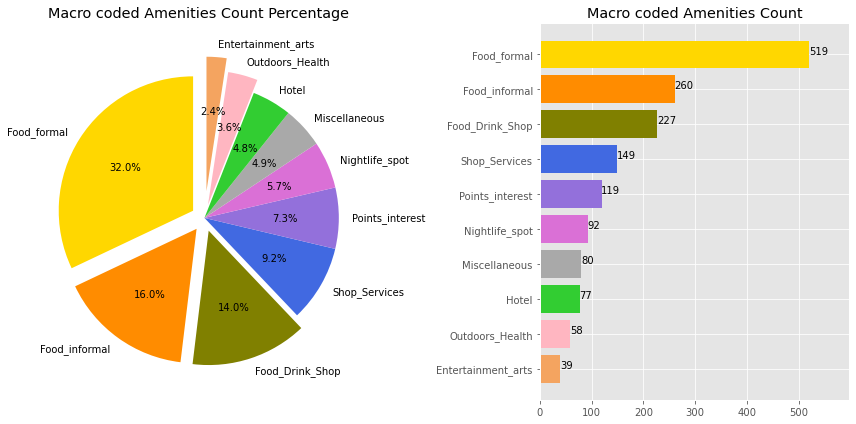

In [42]:
coded_graph = df_am.groupby('Coded_Cat')['Am_Category'].count().to_frame().sort_values(['Am_Category'],ascending=False)

mycolors = ['gold', 'darkorange', 'olive', 'royalblue', 'mediumpurple', 'orchid', 'darkgrey', 'limegreen', 'lightpink',
            'sandybrown']
explode = (0.1, 0.1, 0.1, 0, 0, 0, 0, 0, 0.1, 0.2)  

fig1, (ax1, ax2) = plt.subplots(1,2,figsize=(12,6))

ax1.pie(coded_graph['Am_Category'], explode=explode, labels=coded_graph.index, autopct='%1.1f%%',
        startangle=90,colors = mycolors)
# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')

ax2.barh(coded_graph.index,coded_graph['Am_Category'],color=mycolors)

# create a list to collect the plt.patches data
totals = []

# find the values and append to list
for i in ax2.patches:
    totals.append(i.get_width())

# set individual bar lables using above list
total = sum(totals)

# set individual bar lables using above list
for i in ax2.patches:
    # get_width pulls left or right; get_y pushes up or down
    ax2.text(i.get_width()-.3, i.get_y()+.38, \
            str(i.get_width()), fontsize=10, color='black')

# invert for largest on top 
ax2.invert_yaxis()

ax1.set(title = "Macro coded Amenities Count Percentage")
ax2.set(title = "Macro coded Amenities Count")
ax2.set_xmargin(0.15)

plt.tight_layout()
plt.show()

First raw insights:
1. We have many Food related amenities.
2. We are poor in Entertainment and Arts amenities.
3. The food category (formal plus informal) makes up almost 50% of all amenities.
4. For fun the entertainment & arts, points of interest, outdoors & health  and Nightlife Spots make up 19% of all amenities.

Ok, with this, more manageable categorization, let's see our data in a map it with different colors

In [43]:
#helper function to do the coloring
def coloring(cat):
    if( cat == 'Food_formal'):
        return 'gold'
    if( cat == 'Food_informal'):
        return 'darkorange'
    if( cat == 'Food_Drink_Shop'):
        return 'olive'
    if( cat == 'Shop_Services'):
        return 'royalblue'
    if( cat == 'Points_interest'):
        return 'mediumpurple'
    if( cat == 'Nightlife_spot'):
        return 'orchid'
    if( cat == 'Miscellaneous'):
        return 'darkgrey'
    if( cat == 'Hotel'):
        return 'limegreen'
    if( cat == 'Outdoors_Health'):
        return 'lightpink'
    if( cat == 'Entertainment_arts'):
        return 'sandybrown'    
    else:
        return 'black'

In [44]:
map_am_cod = folium.Map(location=am_center, zoom_start=10)

# add markers to map
for lat, lng, ort, orts in zip(df_am['Am_Lat'], df_am['Am_Lon'], df_am['Amenity'],df_am['Coded_Cat']):
    label = '{}, {}'.format(ort, orts)
    label = folium.Popup(label, parse_html=True)
    color1 = coloring(orts)
    folium.CircleMarker([lat, lng],
                  radius=3,
                  popup=label,
                  color=color1,
                  fill=True,
                  fill_color=color1,
                  fill_opacity=1,
                  parse_html=False).add_to(map_am_cod)

map_am_cod

Click in any point to get more information

So, the color scheme of our new categories is as following:
1. **'Food_formal'** in **'gold'**

2. **'Food_informal'** in **'darkorange'**

3. **'Food_Drink_Shop'** in **'olive'**

4. **'Shop_Services'** in **'royalblue'**

5. **'Points_interest'** in **'mediumpurple'**

6. **'Nightlife_spot'** in **'orchid (purple)'**

7. **'Miscellaneous'** in **'darkgrey'**

8. **'Hotel'** in **'limegreen'**

9. **'Outdoors_Health'** in **'lightpink'**

10. **'Entertainment_arts'** in **'sandybrown'** 

Let's try to map this in a more user-friendly way, where we can choose which amenities we want to see. 

In [45]:
from folium import plugins

map_cod = folium.Map(location=am_center, zoom_start=10, tiles='cartodbdark_matter')


mcg = folium.plugins.MarkerCluster(control=False)
map_cod.add_child(mcg)

g1 = folium.plugins.FeatureGroupSubGroup(mcg, "Food Formal")
map_cod.add_child(g1)

g2 = folium.plugins.FeatureGroupSubGroup(mcg, "Food Informal")
map_cod.add_child(g2)

g3 = folium.plugins.FeatureGroupSubGroup(mcg, "Food and Drink Shop")
map_cod.add_child(g3)

g4 = folium.plugins.FeatureGroupSubGroup(mcg, "Shop and Services")
map_cod.add_child(g4)

g5 = folium.plugins.FeatureGroupSubGroup(mcg, "Points of interest")
map_cod.add_child(g5)

g6 = folium.plugins.FeatureGroupSubGroup(mcg, "Nightlife spots")
map_cod.add_child(g6)

g7 = folium.plugins.FeatureGroupSubGroup(mcg, "Miscellaneous")
map_cod.add_child(g7)

g8 = folium.plugins.FeatureGroupSubGroup(mcg, "Hotel")
map_cod.add_child(g8)

g9 = folium.plugins.FeatureGroupSubGroup(mcg, "Outdoors and Health")
map_cod.add_child(g9)

g10 = folium.plugins.FeatureGroupSubGroup(mcg, "Entertainment and Arts")
map_cod.add_child(g10)

for lat, lng, ort, orts in zip(df_am['Am_Lat'], df_am['Am_Lon'], df_am['Amenity'],df_am['Coded_Cat']):
    label = '{}, {}'.format(ort, orts)
    label = folium.Popup(label, parse_html=True)
    color1 = coloring(orts)
    if(orts == 'Food_formal'):
        folium.CircleMarker([lat, lng],radius=3,popup=label,color=color1,fill=True,fill_color=color1,fill_opacity=1,parse_html=False).add_to(g1)
    if(orts == 'Food_informal'):
        folium.CircleMarker([lat, lng],radius=3,popup=label,color=color1,fill=True,fill_color=color1,fill_opacity=1,parse_html=False).add_to(g2)
    if(orts == 'Food_Drink_Shop'):
        folium.CircleMarker([lat, lng],radius=3,popup=label,color=color1,fill=True,fill_color=color1,fill_opacity=1,parse_html=False).add_to(g3)
    if(orts == 'Shop_Services'):
        folium.CircleMarker([lat, lng],radius=3,popup=label,color=color1,fill=True,fill_color=color1,fill_opacity=1,parse_html=False).add_to(g4)
    if(orts == 'Points_interest'):
        folium.CircleMarker([lat, lng],radius=3,popup=label,color=color1,fill=True,fill_color=color1,fill_opacity=1,parse_html=False).add_to(g5)
    if(orts == 'Nightlife_spot'):
        folium.CircleMarker([lat, lng],radius=3,popup=label,color=color1,fill=True,fill_color=color1,fill_opacity=1,parse_html=False).add_to(g6)
    if(orts == 'Miscellaneous'):
        folium.CircleMarker([lat, lng],radius=3,popup=label,color=color1,fill=True,fill_color=color1,fill_opacity=1,parse_html=False).add_to(g7)
    if(orts == 'Hotel'):
        folium.CircleMarker([lat, lng],radius=3,popup=label,color=color1,fill=True,fill_color=color1,fill_opacity=1,parse_html=False).add_to(g8)
    if(orts == 'Outdoors_Health'):
        folium.CircleMarker([lat, lng],radius=3,popup=label,color=color1,fill=True,fill_color=color1,fill_opacity=1,parse_html=False).add_to(g9)
    if(orts == 'Entertainment_arts'):
        folium.CircleMarker([lat, lng],radius=3,popup=label,color=color1,fill=True,fill_color=color1,fill_opacity=1,parse_html=False).add_to(g10)
        
    
        
folium.LayerControl(collapsed=False).add_to(map_cod)

map_cod

To interact with this map you can zoom in or out, click the areas on the map and select all or some of the categories in the box on the right.

In this map we can see the larger concentrations of amenities are in:
1. 844 amenities in the center of Frankfurt am Main
2. 211 in the area around Bad Soden am Taunus
3. 127 in the area around Bad Homburg vor der Höhe
4. And following close with 81, 80, 72 amenities we have Hattersheim, Offenbach am Main and Hanau respectively

Evaluating the concentration on Food related amenities (Food formal and Food informal) we see that two areas stick out Frankfurt am Main center with 457 and 96 around Bad Soden am Taunus and this pattern replicates itself to the other categories.

To end this exploration let's do a Heatmap and find the areas where we have amenities concentrations

In [46]:
#funciona
from folium.plugins import HeatMap

map_heat = folium.Map(location=am_center, zoom_start=10, tiles='cartodbdark_matter')

HeatMap(data = df_am[['Am_Lat','Am_Lon']].values.tolist()).add_to(map_heat)
HeatMap(data = df_am[['Am_Lat','Am_Lon']].values.tolist(),radius=8, max_zoom=13).add_to(map_heat)

map_heat

In this map you can explore the amenities density. The redder the area the more amenities available. As we can see the areas previously identified appear in bright red.

Finally let's put it all together areas of study, amenities locations and heat map and visualize it.

In [47]:
for lat, lng, ort, orts in zip(df_am['Am_Lat'], df_am['Am_Lon'], df_am['Amenity'],df_am['Coded_Cat']):
    label = '{}, {}'.format(ort, orts)
    label = folium.Popup(label, parse_html=True)
    color1 = coloring(orts)
    folium.CircleMarker([lat, lng],
                  radius=3,
                  popup=label,
                  color=color1,
                  fill=True,
                  fill_color=color1,
                  fill_opacity=1,
                  parse_html=False).add_to(map_heat)

map_heat

**Clustering data preparation: Onehot Encoding and Exploration**

Now we'll try to cluster our areas to see which ones are the most similar. We we'll use the K Means Algorithm for our study.

As said before, we tolerate some overlapping, so we'll use the complete amenities dataset for this part of the study. 

In [48]:
am_enc=amenities.copy()

In [49]:
am_enc['PLZ_Ort'] = am_enc[['PLZ', 'Ort']].agg(' - '.join, axis=1)
am_enc.drop(['PLZ','Ort'], axis=1, inplace=True)

am_enc = am_enc.rename(columns={'PLZ_Ort': 'Area','Ort_Lat':'Area_Lat','Ort_Lon':'Area_Lon'})

fixed_columns = [am_enc.columns[-1]] + list(am_enc.columns[:-1])
am_enc = am_enc[fixed_columns]

am_enc.head()
#print('There are {} uniques categories.'.format(len(df_am['Am_Category'].unique())))

,Area,Area_Lat,Area_Lon,Amenity,Am_Lat,Am_Lon,Am_Category
0,65520 - Bad Camberg,50.299603,8.267312,REWE,50.301920,8.260702,Supermarket
1,65520 - Bad Camberg,50.299603,8.267312,India Haus,50.298974,8.264521,Indian Restaurant
2,65520 - Bad Camberg,50.299603,8.267312,Kurpark Bad Camberg,50.297865,8.272318,Park
3,65520 - Bad Camberg,50.299603,8.267312,Banyan Garden,50.295113,8.269464,Chinese Restaurant
4,65520 - Bad Camberg,50.299603,8.267312,Cafe Schäfer,50.302721,8.260552,Bakery


It is important also to see also how many amenities are in each area

In [50]:
dfa = am_enc.groupby('Area')['Amenity'].count().to_frame().sort_values(['Amenity'],ascending=False).copy()
#dfa = dfa.rename(columns={'Amenity': 'Amenity (Desc)'})
dfa

,Amenity
Area,
60313 - Frankfurt am Main,100
60329 - Frankfurt am Main,100
60311 - Frankfurt am Main,79
60594 - Frankfurt am Main,68
60385 - Frankfurt am Main,61
60318 - Frankfurt am Main,58
60316 - Frankfurt am Main,56
63454 - Hanau,50
61348 - Bad Homburg vor der Höhe,47


In [51]:
#Kmeans preparation - one hot

# one hot encoding
am_onehot = pd.get_dummies(am_enc[['Am_Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
am_onehot['Area'] = am_enc['Area'] 

# move neighborhood column to the first column
fixed_columns = [am_onehot.columns[-1]] + list(am_onehot.columns[:-1])
am_onehot = am_onehot[fixed_columns]

am_onehot.head()

,Area,Accessories Store,African Restaurant,American Restaurant,Amphitheater,Apple Wine Pub,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,Bakery,Bank,Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bistro,Board Shop,Boarding House,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Breakfast Spot,Brewery,Buddhist Temple,Building,Burger Joint,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Castle,Cheese Shop,Chinese Restaurant,Chocolate Shop,Cigkofte Place,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Cupcake Shop,Currywurst Joint,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Eastern European Restaurant,Electronics Store,Escape Room,Ethiopian Restaurant,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Friterie,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Travel,German Restaurant,Gift Shop,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Rink,Hookah Bar,Hostel,Hot Spring,Hotel,Hotel Bar,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Karaoke Bar,Kebab Restaurant,Korean Restaurant,Lake,Laser Tag,Light Rail Station,Liquor Store,Locksmith,Lounge,Malay Restaurant,Malga,Market,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music Venue,Neighborhood,Nightclub,Optical Shop,Organic Grocery,Outdoor Supply Store,Outdoors & Recreation,Palace,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Pet Store,Pharmacy,Photography Studio,Piano Bar,Pizza Place,Playground,Plaza,Pool,Portuguese Restaurant,Post Office,Pub,Radio Station,Ramen Restaurant,Recreation Center,Rental Car Location,Rest Area,Restaurant,River,Road,Rock Club,Roof Deck,Salad Place,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shipping Store,Shoe Store,Shopping Mall,Soccer Field,Soup Place,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Club,Stables,Steakhouse,Supermarket,Sushi Restaurant,Swiss Restaurant,Szechuan Restaurant,Tapas Restaurant,Taverna,Tea Room,Tennis Court,Thai Restaurant,Theater,Tibetan Restaurant,Toy / Game Store,Trail,Train Station,Tram Station,Trattoria/Osteria,Turkish Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Volleyball Court,Water Park,Waterfall,Waterfront,Whisky Bar,Wine Bar,Yoga Studio
0,65520 - Bad Camberg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,65520 - Bad Camberg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

Next, let's group rows by Area and by taking the mean of the frequency of occurrence of each category

In [52]:
print("Amenities Onehot encoding shape: ",am_onehot.shape)

am_grouped = am_onehot.groupby('Area').mean().reset_index()

print()
print("Amenities Onehot encoding grouped shape: ", am_grouped.shape)
print()
am_grouped.head()

Amenities Onehot encoding shape:  (1673, 235)

Amenities Onehot encoding grouped shape:  (90, 235)



,Area,Accessories Store,African Restaurant,American Restaurant,Amphitheater,Apple Wine Pub,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,Bakery,Bank,Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bistro,Board Shop,Boarding House,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Breakfast Spot,Brewery,Buddhist Temple,Building,Burger Joint,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Castle,Cheese Shop,Chinese Restaurant,Chocolate Shop,Cigkofte Place,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Cupcake Shop,Currywurst Joint,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Eastern European Restaurant,Electronics Store,Escape Room,Ethiopian Restaurant,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Friterie,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Travel,German Restaurant,Gift Shop,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Rink,Hookah Bar,Hostel,Hot Spring,Hotel,Hotel Bar,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Karaoke Bar,Kebab Restaurant,Korean Restaurant,Lake,Laser Tag,Light Rail Station,Liquor Store,Locksmith,Lounge,Malay Restaurant,Malga,Market,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music Venue,Neighborhood,Nightclub,Optical Shop,Organic Grocery,Outdoor Supply Store,Outdoors & Recreation,Palace,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Pet Store,Pharmacy,Photography Studio,Piano Bar,Pizza Place,Playground,Plaza,Pool,Portuguese Restaurant,Post Office,Pub,Radio Station,Ramen Restaurant,Recreation Center,Rental Car Location,Rest Area,Restaurant,River,Road,Rock Club,Roof Deck,Salad Place,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shipping Store,Shoe Store,Shopping Mall,Soccer Field,Soup Place,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Club,Stables,Steakhouse,Supermarket,Sushi Restaurant,Swiss Restaurant,Szechuan Restaurant,Tapas Restaurant,Taverna,Tea Room,Tennis Court,Thai Restaurant,Theater,Tibetan Restaurant,Toy / Game Store,Trail,Train Station,Tram Station,Trattoria/Osteria,Turkish Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Volleyball Court,Water Park,Waterfall,Waterfront,Whisky Bar,Wine Bar,Yoga Studio
0,35510 - Butzbach,0.00,0.00,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.00000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.00,0.0,0.000000,0.000000,0.00,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.066667,0.0,0.0,0.000000,0.000000,0.0,0.0,0.00,0.000000,0.000000,0.000000,0.0,0.133333,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.000000,0.000000,0.133333,0.0,0.000000,0.00000,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0,0.00000,0.000000,0.0,0.0,0.0,0.00,0.0,0.000000,0.000000,0.0,0.066667,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.00

Let's create a matrix of the top 10 most common amenities in each area

In [53]:
#amenities
def getAmRight(row, num_top_venues):
    a = [None] * 10
    #num_top_venues = 10
    #row = am_grouped.iloc[13, :]
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    for rownum,(indx,val) in enumerate(row_categories_sorted.iteritems()):
        if(val > 0.0 and rownum <= num_top_venues-1):
            a[rownum]=indx
    m_array = np.array(a)
    return m_array

In [54]:
#create and display the dataframe

num_top_amenity = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Area']
for ind in np.arange(num_top_amenity):
    try:
        columns.append('{}{} Most Common Amenity'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Amenity'.format(ind+1))

# create a new dataframe
area_am_sorted = pd.DataFrame(columns=columns)
area_am_sorted['Area'] = am_grouped['Area']

for ind in np.arange(am_grouped.shape[0]):
    area_am_sorted.iloc[ind, 1:] = getAmRight(am_grouped.iloc[ind, :], num_top_amenity)

area_am_sorted

,Area,1st Most Common Amenity,2nd Most Common Amenity,3rd Most Common Amenity,4th Most Common Amenity,5th Most Common Amenity,6th Most Common Amenity,7th Most Common Amenity,8th Most Common Amenity,9th Most Common Amenity,10th Most Common Amenity
0,35510 - Butzbach,Supermarket,Drugstore,Construction & Landscaping,Shoe Store,Sandwich Place,Café,Turkish Restaurant,Greek Restaurant,Italian Restaurant,Indie Movie Theater
1,60311 - Frankfurt am Main,Café,German Restaurant,Plaza,Coffee Shop,Restaurant,Gym / Fitness Center,Scenic Lookout,Boutique,Italian Restaurant,Hotel
2,60313 - Frankfurt am Main,Café,Italian Restaurant,Restaurant,Bar,Thai Restaurant,Coffee Shop,Japanese Restaurant,Plaza,Sandwich Place,Doner Restaurant
3,60314 - Frankfurt am Main,Hotel,Gym / Fitness Center,Bakery,Escape Room,Supermarket,Italian Restaurant,Laser Tag,French Restaurant,Hawaiian Restaurant,Outdoor Supply Store
4,60316 - Frankfurt am Main,Café,Italian Restaurant,Burger Joint,Bakery,Thai Restaurant,Bar,Plaza,Modern European Restaurant,Supermarket,Japanese Restaurant
5,60318 - Frankfurt am Main,Café,Italian Restaurant,Supermarket,Ice Cream Shop,Pizza Place,Health Food Store,Bakery,Vietnamese Restaurant,Falafel Restaurant,Greek Restaurant
6,60320 - Frankfurt am Main,Pizza Place,Park,Bus Stop,Concert Hall,Metro Station,Market,Supermarket,Coffee Shop,Cafeteria,Drugstore
7,60322 - Frankfurt am Main,Italian Restaurant,Café,Bus Stop,Deli / Bodega,Falafel Restaurant,Thai Restaurant,Road,Coffee Shop,Supermarket,Lounge
8,60323 - Frankfurt am Main,Italian Restaurant,Bakery,Café,German Restaurant,Supermarket,Steakhouse,Thai Restaurant,Japanese Restaurant,Drugstore,Bistro
9,60325 - Frankfurt am Main,Italian Restaurant,Steakhouse,Plaza,Bakery,Japanese Restaurant,Gym / Fitness Center,Park,Piano Bar,Supermarket,Ramen Restaurant


In this analysis we can see the top 10 most common amenities for each area. It is important to mention that for some areas the data we got from the Foursquare API was very limited. There are cases of areas where we couldn't get any amenities and others where we got only a few, not enough to do a top 10 list.

**Works like this depend on the assumptions made, and we can always tweak the analysis manually to get better results, but in the end apart from doing all the work manually and not relying in computers (when this is possible), there will always be flaws.**

**Clustering Areas: K Means Analysis**

One of the most used machine learning clustering algorithms is k-means. It allows us to group the data according to the existing similarities among them in k clusters, given as input to the algorithm.

The basic concept of k-means stands on mathematical calculations (means, euclidian distances) and it mainly applies to numerical data and finding the nearest neighbor around a cluster center. We can transform our categorical values in numerical values and apply k-means. By using numerical distances it will consider close, those objects, which have close numbers or in other words similar numbers of amenities.

Let's use it !

First we need to evaluate the optimal number of clusters for our data so we'll da elbow plot

In [55]:
#evaluate best number of clusters
from sklearn.cluster import KMeans


am_grouped_clustering = am_grouped.drop('Area', 1)

sum_of_squared_distances = []
K = range(1,15)
for k in K:
    k_means = KMeans(init="k-means++", n_clusters=k, random_state=0, n_init=12)
    model = k_means.fit(am_grouped_clustering)
    sum_of_squared_distances.append(k_means.inertia_)

C:\Users\ricar\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


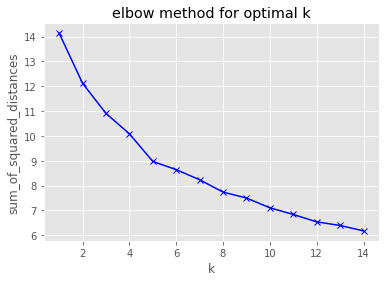

In [56]:
plt.plot(K, sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('sum_of_squared_distances')
plt.title('elbow method for optimal k')
plt.show()

From the graph above we are going to choose 7 as the optimal number of clusters for our analysis. We had some doubts whether to choose 7 or 8, but the subsequent metrics analysis proved better for 7.

In [57]:
# set number of clusters
kclusters = 7

# run k-means clustering
kmeans = KMeans(init="k-means++", n_clusters=kclusters, random_state=0, n_init=12).fit(am_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

Since we did the analysis on the elbow plot let's evaluate some metrics

In [58]:
from sklearn import metrics
labels = kmeans.labels_
print("Silhouette Coefficient: ", metrics.silhouette_score(am_grouped_clustering, labels))
print("Calinski Harabasz Score: ", metrics.calinski_harabasz_score(am_grouped_clustering, labels))
print("Davies-Bouldin Index: ", metrics.davies_bouldin_score(am_grouped_clustering, labels))

Silhouette Coefficient:  0.17968982461624577
Calinski Harabasz Score:  9.911930945737094
Davies-Bouldin Index:  1.3899645123333737


The Silhouette Coefficient is defined for each sample and is composed of two scores(shown in below), and a higher Silhouette Coefficient score relates to a model with better defined clusters. The score is bounded between -1 for incorrect clustering and +1 for highly dense clustering. Scores around zero indicate overlapping clusters. The score is higher when clusters are dense and well separated, which relates to a standard concept of a cluster.

The Calinski-Harabasz index also known as the Variance Ratio Criterion, is the ratio of the sum of between-clusters dispersion and of inter-cluster dispersion for all clusters, the higher the score, the better the performances. The score is higher when clusters are dense and well separated, which relates to a standard concept of a cluster.

The Davies-Bouldin Index signifies the average ‘similarity’ between clusters, where the similarity is a measure that compares the distance between clusters with the size of the clusters themselves. A lower Davies-Bouldin index relates to a model with better separation between the clusters.

In conclusion the numbers we got are not great, but they will do.

**Plotting clusters**

In [59]:
am_data = am_df.copy()

In [60]:
am_data['PLZ_Ort'] = am_data[['PLZ', 'Ort']].agg(' - '.join, axis=1)
am_data.drop(['PLZ','Ort','Landkreis','einwohner'], axis=1, inplace=True)

am_data = am_data.rename(columns={'PLZ_Ort': 'Area'})

fixed_columns = [am_data.columns[-1]] + list(am_data.columns[:-1])
am_data = am_data[fixed_columns]

am_data.head()

,Area,Ortsteile,latitude,longitude
0,65520 - Bad Camberg,Bad Camberg,50.299603,8.267312
1,61348 - Bad Homburg vor der Höhe,Bad Homburg vor der Höhe,50.226423,8.611368
2,61352 - Bad Homburg vor der Höhe,Bad Homburg vor der Höhe,50.221324,8.653160
3,61350 - Bad Homburg vor der Höhe,Bad Homburg vor der Höhe,50.239388,8.600062
4,61231 - Bad Nauheim,Bad Nauheim,50.368111,8.747361


In [61]:
# add clustering labels
area_am_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

am_merged = am_data

#the join has to be right because one of the areas wasn't classified, for not having any foursquare data (maybe rethink coordinates?)
am_merged = am_merged.join(area_am_sorted.set_index('Area'), on='Area', how='right')

In [62]:
am_merged.head(10)

,Area,Ortsteile,latitude,longitude,Cluster Labels,1st Most Common Amenity,2nd Most Common Amenity,3rd Most Common Amenity,4th Most Common Amenity,5th Most Common Amenity,6th Most Common Amenity,7th Most Common Amenity,8th Most Common Amenity,9th Most Common Amenity,10th Most Common Amenity
7,35510 - Butzbach,Butzbach,50.434042,8.671118,2,Supermarket,Drugstore,Construction & Landscaping,Shoe Store,Sandwich Place,Café,Turkish Restaurant,Greek Restaurant,Italian Restaurant,Indie Movie Theater
16,60311 - Frankfurt am Main,"Altstadt, Innenstadt",50.111320,8.683249,2,Café,German Restaurant,Plaza,Coffee Shop,Restaurant,Gym / Fitness Center,Scenic Lookout,Boutique,Italian Restaurant,Hotel
14,60313 - Frankfurt am Main,"Altstadt, Innenstadt",50.115291,8.682501,2,Café,Italian Restaurant,Restaurant,Bar,Thai Restaurant,Coffee Shop,Japanese Restaurant,Plaza,Sandwich Place,Doner Restaurant
20,60314 - Frankfurt am Main,"Fechenheim, Ostend",50.113812,8.712702,2,Hotel,Gym / Fitness Center,Bakery,Escape Room,Supermarket,Italian Restaurant,Laser Tag,French Restaurant,Hawaiian Restaurant,Outdoor Supply Store
38,60316 - Frankfurt am Main,"Nordend-West, Nordend-Ost, Ostend",50.120735,8.696523,2,Café,Italian Restaurant,Burger Joint,Bakery,Thai Restaurant,Bar,Plaza,Modern European Restaurant,Supermarket,Japanese Restaurant
29,60318 - Frankfurt am Main,"Innenstadt, Nordend-Ost, Nordend-West",50.125006,8.686409,2,Café,Italian Restaurant,Supermarket,Ice Cream Shop,Pizza Place,Health Food Store,Bakery,Vietnamese Restaurant,Falafel Restaurant,Greek Restaurant
25,60320 - Frankfurt am Main,"Dornbusch, Eckenheim, Nordend-West, Westend-No...",50.138976,8.672349,2,Pizza Place,Park,Bus Stop,Concert Hall,Metro Station,Market,Supermarket,Coffee Shop,Cafeteria,Drugstore
22,60322 - Frankfurt am Main,"Dornbusch, Innenstadt, Nordend-West, Westend-N...",50.125116,8.676174,2,Italian Restaurant,Café,Bus Stop,Deli / Bodega,Falafel Restaurant,Thai Restaurant,Road,Coffee Shop,Supermarket,Lounge
18,60323 - Frankfurt am Main,"Westend-Nord, Westend-Süd",50.122005,8.665596,2,Italian Restaurant,Bakery,Café,German Restaurant,Supermarket,Steakhouse,Thai Restaurant,Japanese Restaurant,Drugstore,Bistro
17,60325 - Frankfurt am Main,"Bockenheim, Gallus, Westend-Süd",50.115399,8.659648,2,Italian Restaurant,Steakhouse,Plaza,Bakery,Japanese Restaurant,Gym / Fitness Center,Park,Piano Bar,Supermarket,Ramen Restaurant


In [63]:
import matplotlib.cm as cm
import matplotlib.colors as colors

center2 = get_center_latlong(am_merged,'latitude','longitude')

# create map
map_clusters = folium.Map(location=center2, zoom_start=10, tiles= 'Stamen Toner')

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(am_merged['latitude'], am_merged['longitude'], am_merged['Area'], am_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

Cluster 0 - red

Cluster 1 - purple

Cluster 2 - blue

Cluster 3 - light blue

Cluster 4 - green

Cluster 5 - yellow

Cluster 6 - orange


In [64]:
#primeiro mapa das areas
#primeiro mapa com areas a pesquisar
map_all = folium.Map(location=center, zoom_start=10, tiles="Stamen Toner")

# add markers to map
for lat, lng, ort, orts, plz in zip(am_df['latitude'], am_df['longitude'], am_df['Ort'], am_df['Ortsteile'], am_df['PLZ']):
    if(ort in ['Frankfurt am Main', 'Offenbach am Main']):
        label = '{}, {}, {}'.format(ort, orts, plz)
        label = folium.Popup(label, parse_html=True)
        folium.Circle([lat, lng],
                      radius=500,
                      popup=label,
                      color='red',
                      fill=True,
                      fill_color='#f73447',
                      fill_opacity=0.7,
                      parse_html=False).add_to(map_all)
    else:
        label = '{}, {}, {}'.format(ort, orts, plz)
        label = folium.Popup(label, parse_html=True)
        folium.Circle([lat, lng],
                      radius=1000,
                      popup=label,
                      color='blue',
                      fill=True,
                      fill_color='#3186cc',
                      fill_opacity=0.7,
                      parse_html=False).add_to(map_all)

In [65]:
for lat, lng, ort, orts, plz in zip(amenities['Am_Lat'], amenities['Am_Lon'], amenities['Amenity'],
                                    amenities['Am_Category'], amenities['PLZ']):
    label = '{}, {}, {}'.format(ort, orts, plz)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],
                  radius=3,
                  popup=label,
                  color='white',
                  fill=True,
                  fill_color='white',
                  fill_opacity=1,
                  parse_html=False).add_to(map_all)

In [66]:
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(am_merged['latitude'], am_merged['longitude'], am_merged['Area'], am_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_all)

In [67]:
HeatMap(data = df_am[['Am_Lat','Am_Lon']].values.tolist()).add_to(map_all)
HeatMap(data = df_am[['Am_Lat','Am_Lon']].values.tolist(),radius=8, max_zoom=13).add_to(map_all)
map_all

In [68]:
#analyse clusters
clust = am_merged.copy()
clust_num = dfa.copy()

In [69]:
clust_merged = clust.join(clust_num, on='Area', how='right')

In [70]:
order = [0,1,2,3,15,4,5,6,7,8,9,10,11,12,13,14] # setting column's order
clust_merged = clust_merged[[clust_merged.columns[i] for i in order]]

clust_merged = clust_merged.rename(columns={'Amenity': 'Amenity Count'})

[To Table of Contents](#top)

## 5. Results <a name="results"></a>

#### First Cluster - Cluster 0

In [71]:
clust_merged.loc[clust_merged['Cluster Labels'] == 0, clust_merged.columns[[0,1,4] + list(range(5, clust_merged.shape[1]))]]

,Area,Ortsteile,Amenity Count,Cluster Labels,1st Most Common Amenity,2nd Most Common Amenity,3rd Most Common Amenity,4th Most Common Amenity,5th Most Common Amenity,6th Most Common Amenity,7th Most Common Amenity,8th Most Common Amenity,9th Most Common Amenity,10th Most Common Amenity
70,61267 - Neu-Anspach,Neu-Anspach,12,0,Supermarket,Restaurant,Ice Cream Shop,Gas Station,Fast Food Restaurant,Train Station,Asian Restaurant,Chinese Restaurant,None,None
88,65824 - Schwalbach am Taunus,Schwalbach am Taunus,10,0,Supermarket,Light Rail Station,Doner Restaurant,Fried Chicken Joint,German Restaurant,Discount Store,Korean Restaurant,None,None,None
67,65835 - Liederbach am Taunus,Liederbach am Taunus,9,0,Supermarket,Park,Athletics & Sports,Neighborhood,Train Station,German Restaurant,Drugstore,None,None,None
45,65929 - Frankfurt am Main,"Höchst, Unterliederbach",7,0,Supermarket,Hotel,Ice Cream Shop,Falafel Restaurant,Convenience Store,Italian Restaurant,None,None,None,None
75,65527 - Niedernhausen,Niedernhausen,6,0,Supermarket,Bakery,Diner,Fast Food Restaurant,Bar,None,None,None,None,None
10,61197 - Florstadt,Florstadt,6,0,Supermarket,Ice Cream Shop,Drugstore,Italian Restaurant,None,None,None,None,None,None
74,61138 - Niederdorfelden,Niederdorfelden,5,0,Supermarket,Bakery,Train Station,Health & Beauty Service,None,None,None,None,None,None
87,61137 - Schöneck,Schöneck (Hessen),5,0,Supermarket,Train Station,Auto Garage,None,None,None,None,None,None,None
82,63071 - Offenbach am Main,"Offenbach am Main, Tempelsee",4,0,Hotel,Bakery,Supermarket,Restaurant,None,None,None,None,None,None
91,61250 - Usingen,Usingen,4,0,Supermarket,Italian Restaurant,Café,None,None,None,None,None,None,None


#### Second Cluster - Cluster 1

In [72]:
clust_merged.loc[clust_merged['Cluster Labels'] == 1, clust_merged.columns[[0,1,4] + list(range(5, clust_merged.shape[1]))]]

,Area,Ortsteile,Amenity Count,Cluster Labels,1st Most Common Amenity,2nd Most Common Amenity,3rd Most Common Amenity,4th Most Common Amenity,5th Most Common Amenity,6th Most Common Amenity,7th Most Common Amenity,8th Most Common Amenity,9th Most Common Amenity,10th Most Common Amenity
73,61130 - Nidderau,Nidderau,9,1,Train Station,Plaza,Supermarket,Shopping Mall,Movie Theater,German Restaurant,None,None,None,None
93,61273 - Wehrheim,Wehrheim,4,1,Supermarket,German Restaurant,Café,Train Station,None,None,None,None,None,None
84,61203 - Reichelsheim,Reichelsheim (Wetterau),2,1,Organic Grocery,Train Station,None,None,None,None,None,None,None,None


#### Third Cluster - Cluster 2

In [73]:
clust_merged.loc[clust_merged['Cluster Labels'] == 2, clust_merged.columns[[0,1,4] + list(range(5, clust_merged.shape[1]))]]

,Area,Ortsteile,Amenity Count,Cluster Labels,1st Most Common Amenity,2nd Most Common Amenity,3rd Most Common Amenity,4th Most Common Amenity,5th Most Common Amenity,6th Most Common Amenity,7th Most Common Amenity,8th Most Common Amenity,9th Most Common Amenity,10th Most Common Amenity
14,60313 - Frankfurt am Main,"Altstadt, Innenstadt",100,2,Café,Italian Restaurant,Restaurant,Bar,Thai Restaurant,Coffee Shop,Japanese Restaurant,Plaza,Sandwich Place,Doner Restaurant
13,60329 - Frankfurt am Main,"Bahnhofsviertel, Gallus, Gutleutviertel, Innen...",100,2,Hotel,Indian Restaurant,Bar,Vietnamese Restaurant,Restaurant,Café,Chinese Restaurant,Seafood Restaurant,Bakery,Mexican Restaurant
16,60311 - Frankfurt am Main,"Altstadt, Innenstadt",79,2,Café,German Restaurant,Plaza,Coffee Shop,Restaurant,Gym / Fitness Center,Scenic Lookout,Boutique,Italian Restaurant,Hotel
26,60594 - Frankfurt am Main,Sachsenhausen-Nord,68,2,Apple Wine Pub,German Restaurant,Falafel Restaurant,Pizza Place,Bar,Café,Italian Restaurant,Dive Bar,Pub,Spanish Restaurant
48,60385 - Frankfurt am Main,"Bornheim, Nordend-Ost, Ostend",61,2,Café,German Restaurant,Drugstore,Spanish Restaurant,Ice Cream Shop,Falafel Restaurant,Cocktail Bar,Bakery,Tram Station,Thai Restaurant
29,60318 - Frankfurt am Main,"Innenstadt, Nordend-Ost, Nordend-West",58,2,Café,Italian Restaurant,Supermarket,Ice Cream Shop,Pizza Place,Health Food Store,Bakery,Vietnamese Restaurant,Falafel Restaurant,Greek Restaurant
38,60316 - Frankfurt am Main,"Nordend-West, Nordend-Ost, Ostend",56,2,Café,Italian Restaurant,Burger Joint,Bakery,Thai Restaurant,Bar,Plaza,Modern European Restaurant,Supermarket,Japanese Restaurant
57,63454 - Hanau,"Hanau, Kesselstadt, Mittelbuchen",50,2,Supermarket,Clothing Store,Drugstore,Shopping Mall,Hotel,German Restaurant,Gastropub,Fried Chicken Joint,Pizza Place,Plaza
1,61348 - Bad Homburg vor der Höhe,Bad Homburg vor der Höhe,47,2,Italian Restaurant,German Restaurant,Hotel,Clothing Store,Ice Cream Shop,Supermarket,Café,Drugstore,Sushi Restaurant,Steakhouse
18,60323 - Frankfurt am Main,"Westend-Nord, Westend-Süd",44,2,Italian Restaurant,Bakery,Café,German Restaurant,Supermarket,Steakhouse,Thai Restaurant,Japanese Restaurant,Drugstore,Bistro


#### Fourth Cluster - Cluster 3

In [74]:
clust_merged.loc[clust_merged['Cluster Labels'] == 3, clust_merged.columns[[0,1,4] + list(range(5, clust_merged.shape[1]))]]

,Area,Ortsteile,Amenity Count,Cluster Labels,1st Most Common Amenity,2nd Most Common Amenity,3rd Most Common Amenity,4th Most Common Amenity,5th Most Common Amenity,6th Most Common Amenity,7th Most Common Amenity,8th Most Common Amenity,9th Most Common Amenity,10th Most Common Amenity
39,60599 - Frankfurt am Main,"Oberrad, Sachsenhausen-Nord, Sachsenhausen-Süd",1,3,Tram Station,None,None,None,None,None,None,None,None,None


#### Fifth Cluster - Cluster 4

In [75]:
clust_merged.loc[clust_merged['Cluster Labels'] == 4, clust_merged.columns[[0,1,4] + list(range(5, clust_merged.shape[1]))]]

,Area,Ortsteile,Amenity Count,Cluster Labels,1st Most Common Amenity,2nd Most Common Amenity,3rd Most Common Amenity,4th Most Common Amenity,5th Most Common Amenity,6th Most Common Amenity,7th Most Common Amenity,8th Most Common Amenity,9th Most Common Amenity,10th Most Common Amenity
72,61194 - Niddatal,Niddatal,1,4,Electronics Store,None,None,None,None,None,None,None,None,None


#### Sixth Cluster - Cluster 5

In [76]:
clust_merged.loc[clust_merged['Cluster Labels'] == 5, clust_merged.columns[[0,1,4] + list(range(5, clust_merged.shape[1]))]]

,Area,Ortsteile,Amenity Count,Cluster Labels,1st Most Common Amenity,2nd Most Common Amenity,3rd Most Common Amenity,4th Most Common Amenity,5th Most Common Amenity,6th Most Common Amenity,7th Most Common Amenity,8th Most Common Amenity,9th Most Common Amenity,10th Most Common Amenity
66,61476 - Kronberg,Kronberg im Taunus,21,5,German Restaurant,Hotel,Trattoria/Osteria,Movie Theater,Business Service,Plaza,Supermarket,Café,Castle,Bank
89,61449 - Steinbach,Steinbach (Taunus),10,5,German Restaurant,Supermarket,Ice Cream Shop,Plaza,Café,Korean Restaurant,None,None,None,None
56,61279 - Grävenwiesbach,Grävenwiesbach,7,5,Bar,Liquor Store,Hostel,Diner,Soccer Field,Train Station,German Restaurant,None,None,None
55,61479 - Glashütten,Glashütten (Taunus),4,5,Hotel,German Restaurant,Café,None,None,None,None,None,None,None
79,63075 - Offenbach am Main,"Bürgel, Offenbach am Main, Rumpenheim, Waldheim",4,5,Hotel,Pizza Place,Bus Stop,Tennis Court,None,None,None,None,None,None
92,65529 - Waldems,Waldems,3,5,Trail,Business Service,German Restaurant,None,None,None,None,None,None,None
34,60529 - Frankfurt am Main,Schwanheim,3,5,Arts & Crafts Store,German Restaurant,Tram Station,None,None,None,None,None,None,None
31,60388 - Frankfurt am Main,"Bergen-Enkheim, Seckbach",3,5,German Restaurant,Outdoors & Recreation,Greek Restaurant,None,None,None,None,None,None,None


#### Seventh Cluster - Cluster 6

In [77]:
clust_merged.loc[clust_merged['Cluster Labels'] == 6, clust_merged.columns[[0,1,4] + list(range(5, clust_merged.shape[1]))]]

,Area,Ortsteile,Amenity Count,Cluster Labels,1st Most Common Amenity,2nd Most Common Amenity,3rd Most Common Amenity,4th Most Common Amenity,5th Most Common Amenity,6th Most Common Amenity,7th Most Common Amenity,8th Most Common Amenity,9th Most Common Amenity,10th Most Common Amenity
60,"65510 - Idstein, Hünstetten","Idstein, Hünstetten",1,6,Scenic Lookout,None,None,None,None,None,None,None,None,None
94,61276 - Weilrod,Weilrod,1,6,Scenic Lookout,None,None,None,None,None,None,None,None,None


**Clusters in Heatmap**

In [78]:
map_clust_heat = map_clusters

HeatMap(data = df_am[['Am_Lat','Am_Lon']].values.tolist()).add_to(map_clust_heat)
HeatMap(data = df_am[['Am_Lat','Am_Lon']].values.tolist(),radius=8, max_zoom=13).add_to(map_clust_heat)

map_clust_heat

From our analysis we can see that the areas from cluster 0 and 3 have the most amenities while the remaining clusters only have between 1 and 3 areas with very few amenities.

Considering amenities density, cluster 0 areas, are near yellow zones and cluster 3 areas, are near red zones in the heatmap.

Ranking the clusters by number of amenities available we get:

1. **Cluster 3 with the most amenities of all and greater variety category wise. Food related amenities account for the most common amenities in all areas**.


2. **Cluster 0 contains mostly shopping related amenities. Supermarket is the most common amenity in all clustered areas.**


3. **The remaining clusters 1,2,4,5 and 6 contain areas with low amenities density and little variety.**

Cluster 3 contains 1436 amenities, while cluster 0 has 211 amenities and the remaining 26 belong to the combined clusters 1,2,4,5,6.

### Cluster 3 Areas

In [79]:
clust_merged[['Area','Ortsteile']].loc[clust_merged['Cluster Labels'] == 3]

,Area,Ortsteile
39,60599 - Frankfurt am Main,"Oberrad, Sachsenhausen-Nord, Sachsenhausen-Süd"


### Cluster 0 Areas

In [80]:
clust_merged[['Area','Ortsteile']].loc[clust_merged['Cluster Labels'] == 0]

,Area,Ortsteile
70,61267 - Neu-Anspach,Neu-Anspach
88,65824 - Schwalbach am Taunus,Schwalbach am Taunus
67,65835 - Liederbach am Taunus,Liederbach am Taunus
45,65929 - Frankfurt am Main,"Höchst, Unterliederbach"
75,65527 - Niedernhausen,Niedernhausen
10,61197 - Florstadt,Florstadt
74,61138 - Niederdorfelden,Niederdorfelden
87,61137 - Schöneck,Schöneck (Hessen)
82,63071 - Offenbach am Main,"Offenbach am Main, Tempelsee"
91,61250 - Usingen,Usingen


### Clusters 1,2,4,5,6 Areas

In [81]:
option = [1,2,4,5,6]
clust_merged[['Area','Ortsteile']].loc[clust_merged['Cluster Labels'].isin(option)]

,Area,Ortsteile
14,60313 - Frankfurt am Main,"Altstadt, Innenstadt"
13,60329 - Frankfurt am Main,"Bahnhofsviertel, Gallus, Gutleutviertel, Innen..."
16,60311 - Frankfurt am Main,"Altstadt, Innenstadt"
26,60594 - Frankfurt am Main,Sachsenhausen-Nord
48,60385 - Frankfurt am Main,"Bornheim, Nordend-Ost, Ostend"
29,60318 - Frankfurt am Main,"Innenstadt, Nordend-Ost, Nordend-West"
38,60316 - Frankfurt am Main,"Nordend-West, Nordend-Ost, Ostend"
57,63454 - Hanau,"Hanau, Kesselstadt, Mittelbuchen"
1,61348 - Bad Homburg vor der Höhe,Bad Homburg vor der Höhe
18,60323 - Frankfurt am Main,"Westend-Nord, Westend-Süd"


[To Table of Contents](#top)

## 6. Discussion <a name="discussion"></a>

In our study we explored the area surrounding **Bad Homburg vor der Höhe**, to find the locations with the most amenities available, towards a goal of defining the best places to buy a house or live. 

After defining the locations, we wished to study and getting all the relevant data about those places, we searched for coordinates (latitude and longitude). When we plotted the different coordinates in a map and defined a radius for the amenities search, we decided that a 500 meters radius was not enough to get a significant, and sometimes any, amenities result, with the exception of Frankfurt am Main and Offenbach am Main. So, we decided that we would do two search radius one 500 meters and the other 1000 meters. 

To further increase the amenities search result, we changed the coordinates used. At first we were using postal codes to get all coordinates but we noticed that some postal codes coordinates would be far from the city centers, resulting in not getting any amenities, so we decided that for the cities with only one postal code we would get the coordinates from the city center. This means that apart from **Bad Homburg vor der Höhe**, Frankfurt am Main and Offenbach am Main, the coordinates we got were from the city centers.  

After compiling our main dataset, we used a machine learning algorithm - K Means Clustering - to cluster all areas according to their amenities profile.  

The results indicate that we have two major clusters 3 and 0.

The first relevant cluster, Cluster 3, show us areas to live that are rich in amenities in number and variety. The main amenities categories present are food related, Italian restaurants, hotels and German restaurants are respectively the first, second and third most common amenities in these areas.

The second relevant cluster, Cluster 0, show us areas to live that easy to shop. The areas in this cluster contain much less amenities than the previous cluster, but they have a good mix. Supermarkets are the first, second and third most common amenities in these areas.

These results matter as a start for a larger study, and also there is room for improvement in this study. We should try to expand our amenities dataset, by pinpointing optimal coordinates or getting other sources. We should also include new datasets like housing market, quality of living indexes, etc. to explore other avenues of research. We should also try other machine learning clustering algorithms and compare results.

[To Table of Contents](#top)

## 7. Conclusion <a name="conclusion"></a>

This research aimed to provide information about areas to buy a house based on amenities availability. For that we used a machine learning algorithm - K means clustering - in a dataset comprised of the mean of the frequency of occurrence of each category in each area. As a result, we found the relevant clusters. 

For us it is clear, based on our study, that pertaining to amenities density **one should buy in one of the areas in cluster 3**. 

This, of course does not mean that you should be rushing to buy in any of those areas, further developing of this research is needed, this is only a starting point.

[To Table of Contents](#top)

## Extra: Reexploring clustering with macro categorization

In [82]:
df_alt = amenities.copy()
df_alt[['Coded_Cat']] = df_alt.Am_Category.apply(lambda x: category_coder(x) if x else None)


In [83]:
df_alt.head()

,PLZ,Ort,Ort_Lat,Ort_Lon,Amenity,Am_Lat,Am_Lon,Am_Category,Coded_Cat
0,65520,Bad Camberg,50.299603,8.267312,REWE,50.301920,8.260702,Supermarket,Food_Drink_Shop
1,65520,Bad Camberg,50.299603,8.267312,India Haus,50.298974,8.264521,Indian Restaurant,Food_formal
2,65520,Bad Camberg,50.299603,8.267312,Kurpark Bad Camberg,50.297865,8.272318,Park,Points_interest
3,65520,Bad Camberg,50.299603,8.267312,Banyan Garden,50.295113,8.269464,Chinese Restaurant,Food_formal
4,65520,Bad Camberg,50.299603,8.267312,Cafe Schäfer,50.302721,8.260552,Bakery,Food_Drink_Shop


In [84]:
df_alt['PLZ_Ort'] = df_alt[['PLZ', 'Ort']].agg(' - '.join, axis=1)
df_alt.drop(['PLZ','Ort'], axis=1, inplace=True)

df_alt = df_alt.rename(columns={'PLZ_Ort': 'Area','Ort_Lat':'Area_Lat','Ort_Lon':'Area_Lon'})

fixed_columns = [df_alt.columns[-1]] + list(df_alt.columns[:-1])
df_alt = df_alt[fixed_columns]

df_alt.head()

,Area,Area_Lat,Area_Lon,Amenity,Am_Lat,Am_Lon,Am_Category,Coded_Cat
0,65520 - Bad Camberg,50.299603,8.267312,REWE,50.301920,8.260702,Supermarket,Food_Drink_Shop
1,65520 - Bad Camberg,50.299603,8.267312,India Haus,50.298974,8.264521,Indian Restaurant,Food_formal
2,65520 - Bad Camberg,50.299603,8.267312,Kurpark Bad Camberg,50.297865,8.272318,Park,Points_interest
3,65520 - Bad Camberg,50.299603,8.267312,Banyan Garden,50.295113,8.269464,Chinese Restaurant,Food_formal
4,65520 - Bad Camberg,50.299603,8.267312,Cafe Schäfer,50.302721,8.260552,Bakery,Food_Drink_Shop


In [85]:
#Kmeans preparation - one hot

# one hot encoding
alt_onehot = pd.get_dummies(df_alt[['Coded_Cat']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
alt_onehot['Area'] = df_alt['Area'] 

# move neighborhood column to the first column
fixed_columns = [alt_onehot.columns[-1]] + list(alt_onehot.columns[:-1])
alt_onehot = alt_onehot[fixed_columns]

alt_onehot.head()

,Area,Entertainment_arts,Food_Drink_Shop,Food_formal,Food_informal,Hotel,Miscellaneous,Nightlife_spot,Outdoors_Health,Points_interest,Shop_Services
0,65520 - Bad Camberg,0,1,0,0,0,0,0,0,0,0
1,65520 - Bad Camberg,0,0,1,0,0,0,0,0,0,0
2,65520 - Bad Camberg,0,0,0,0,0,0,0,0,1,0
3,65520 - Bad Camberg,0,0,1,0,0,0,0,0,0,0
4,65520 - Bad Camberg,0,1,0,0,0,0,0,0,0,0


In [86]:
print("Amenities Onehot encoding shape: ",alt_onehot.shape)

alt_grouped = alt_onehot.groupby('Area').mean().reset_index()

print()
print("Amenities Onehot encoding grouped shape: ", alt_grouped.shape)
print()
alt_grouped.head()

Amenities Onehot encoding shape:  (1673, 11)

Amenities Onehot encoding grouped shape:  (90, 11)



,Area,Entertainment_arts,Food_Drink_Shop,Food_formal,Food_informal,Hotel,Miscellaneous,Nightlife_spot,Outdoors_Health,Points_interest,Shop_Services
0,35510 - Butzbach,0.066667,0.200000,0.200000,0.133333,0.000000,0.133333,0.000000,0.000000,0.066667,0.200000
1,60311 - Frankfurt am Main,0.063291,0.075949,0.291139,0.227848,0.025316,0.000000,0.063291,0.025316,0.126582,0.101266
2,60313 - Frankfurt am Main,0.030000,0.080000,0.350000,0.160000,0.020000,0.000000,0.110000,0.040000,0.080000,0.130000
3,60314 - Frankfurt am Main,0.024390,0.121951,0.219512,0.097561,0.195122,0.048780,0.048780,0.146341,0.024390,0.073171
4,60316 - Frankfurt am Main,0.071429,0.089286,0.428571,0.250000,0.000000,0.000000,0.071429,0.000000,0.071429,0.017857


In [87]:
#create and display the dataframe

num_top_amenity = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Area']
for ind in np.arange(num_top_amenity):
    try:
        columns.append('{}{} Most Common Amenity'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Amenity'.format(ind+1))

# create a new dataframe
area_alt_sorted = pd.DataFrame(columns=columns)
area_alt_sorted['Area'] = alt_grouped['Area']

for ind in np.arange(alt_grouped.shape[0]):
    area_alt_sorted.iloc[ind, 1:] = getAmRight(alt_grouped.iloc[ind, :], num_top_amenity)

area_alt_sorted

,Area,1st Most Common Amenity,2nd Most Common Amenity,3rd Most Common Amenity,4th Most Common Amenity,5th Most Common Amenity,6th Most Common Amenity,7th Most Common Amenity,8th Most Common Amenity,9th Most Common Amenity,10th Most Common Amenity
0,35510 - Butzbach,Food_Drink_Shop,Food_formal,Shop_Services,Food_informal,Miscellaneous,Entertainment_arts,Points_interest,None,None,None
1,60311 - Frankfurt am Main,Food_formal,Food_informal,Points_interest,Shop_Services,Food_Drink_Shop,Entertainment_arts,Nightlife_spot,Hotel,Outdoors_Health,None
2,60313 - Frankfurt am Main,Food_formal,Food_informal,Shop_Services,Nightlife_spot,Food_Drink_Shop,Points_interest,Outdoors_Health,Entertainment_arts,Hotel,None
3,60314 - Frankfurt am Main,Food_formal,Hotel,Outdoors_Health,Food_Drink_Shop,Food_informal,Shop_Services,Miscellaneous,Nightlife_spot,Entertainment_arts,Points_interest
4,60316 - Frankfurt am Main,Food_formal,Food_informal,Food_Drink_Shop,Entertainment_arts,Nightlife_spot,Points_interest,Shop_Services,None,None,None
5,60318 - Frankfurt am Main,Food_formal,Food_informal,Food_Drink_Shop,Nightlife_spot,Points_interest,Entertainment_arts,Miscellaneous,Outdoors_Health,Shop_Services,None
6,60320 - Frankfurt am Main,Food_informal,Food_formal,Miscellaneous,Food_Drink_Shop,Points_interest,Shop_Services,Entertainment_arts,None,None,None
7,60322 - Frankfurt am Main,Food_formal,Food_Drink_Shop,Food_informal,Miscellaneous,Points_interest,Nightlife_spot,None,None,None,None
8,60323 - Frankfurt am Main,Food_formal,Food_informal,Food_Drink_Shop,Nightlife_spot,Miscellaneous,Outdoors_Health,Shop_Services,None,None,None
9,60325 - Frankfurt am Main,Food_formal,Food_Drink_Shop,Points_interest,Food_informal,Hotel,Nightlife_spot,Outdoors_Health,None,None,None


In [88]:
#evaluate best number of clusters
from sklearn.cluster import KMeans


alt_grouped_clustering = alt_grouped.drop('Area', 1)

sum_of_squared_distances = []
K1 = range(1,15)
for k in K1:
    k_means = KMeans(init="k-means++", n_clusters=k, random_state=0, n_init=12)
    model = k_means.fit(alt_grouped_clustering)
    sum_of_squared_distances.append(k_means.inertia_)

C:\Users\ricar\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


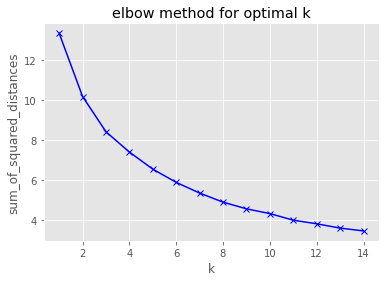

In [89]:
plt.plot(K1, sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('sum_of_squared_distances')
plt.title('elbow method for optimal k')
plt.show()

In [90]:
# set number of clusters
kclus = 3

# run k-means clustering
kmeans = KMeans(init="k-means++", n_clusters=kclus, random_state=0, n_init=12).fit(alt_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([0, 1, 1, 1, 1, 1, 0, 1, 1, 1])

In [91]:
kmeans.labels_

array([0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0,
       1, 1, 0, 1, 1, 1, 1, 1, 2, 2, 1, 2, 0, 0, 1, 0, 0, 0, 0, 2, 1, 0,
       0, 0, 1, 1, 2, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0,
       1, 1, 0, 0, 1, 2, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0])

In [92]:
# add clustering labels
area_alt_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

alt_merged = am_data.copy()

#the join has to be right because one of the areas wasn't classified, for not having any foursquare data (maybe rethink coordinates?)
alt_merged = alt_merged.join(area_alt_sorted.set_index('Area'), on='Area', how='right')

In [93]:
alt_merged

,Area,Ortsteile,latitude,longitude,Cluster Labels,1st Most Common Amenity,2nd Most Common Amenity,3rd Most Common Amenity,4th Most Common Amenity,5th Most Common Amenity,6th Most Common Amenity,7th Most Common Amenity,8th Most Common Amenity,9th Most Common Amenity,10th Most Common Amenity
7,35510 - Butzbach,Butzbach,50.434042,8.671118,0,Food_Drink_Shop,Food_formal,Shop_Services,Food_informal,Miscellaneous,Entertainment_arts,Points_interest,None,None,None
16,60311 - Frankfurt am Main,"Altstadt, Innenstadt",50.111320,8.683249,1,Food_formal,Food_informal,Points_interest,Shop_Services,Food_Drink_Shop,Entertainment_arts,Nightlife_spot,Hotel,Outdoors_Health,None
14,60313 - Frankfurt am Main,"Altstadt, Innenstadt",50.115291,8.682501,1,Food_formal,Food_informal,Shop_Services,Nightlife_spot,Food_Drink_Shop,Points_interest,Outdoors_Health,Entertainment_arts,Hotel,None
20,60314 - Frankfurt am Main,"Fechenheim, Ostend",50.113812,8.712702,1,Food_formal,Hotel,Outdoors_Health,Food_Drink_Shop,Food_informal,Shop_Services,Miscellaneous,Nightlife_spot,Entertainment_arts,Points_interest
38,60316 - Frankfurt am Main,"Nordend-West, Nordend-Ost, Ostend",50.120735,8.696523,1,Food_formal,Food_informal,Food_Drink_Shop,Entertainment_arts,Nightlife_spot,Points_interest,Shop_Services,None,None,None
29,60318 - Frankfurt am Main,"Innenstadt, Nordend-Ost, Nordend-West",50.125006,8.686409,1,Food_formal,Food_informal,Food_Drink_Shop,Nightlife_spot,Points_interest,Entertainment_arts,Miscellaneous,Outdoors_Health,Shop_Services,None
25,60320 - Frankfurt am Main,"Dornbusch, Eckenheim, Nordend-West, Westend-No...",50.138976,8.672349,0,Food_informal,Food_formal,Miscellaneous,Food_Drink_Shop,Points_interest,Shop_Services,Entertainment_arts,None,None,None
22,60322 - Frankfurt am Main,"Dornbusch, Innenstadt, Nordend-West, Westend-N...",50.125116,8.676174,1,Food_formal,Food_Drink_Shop,Food_informal,Miscellaneous,Points_interest,Nightlife_spot,None,None,None,None
18,60323 - Frankfurt am Main,"Westend-Nord, Westend-Süd",50.122005,8.665596,1,Food_formal,Food_informal,Food_Drink_Shop,Nightlife_spot,Miscellaneous,Outdoors_Health,Shop_Services,None,None,None
17,60325 - Frankfurt am Main,"Bockenheim, Gallus, Westend-Süd",50.115399,8.659648,1,Food_formal,Food_Drink_Shop,Points_interest,Food_informal,Hotel,Nightlife_spot,Outdoors_Health,None,None,None


In [94]:
import matplotlib.cm as cm
import matplotlib.colors as colors


center3 = get_center_latlong(alt_merged,'latitude','longitude')

# create map
alt_clusters = folium.Map(location=center3, zoom_start=10, tiles= 'Stamen Toner')

# set color scheme for the clusters
x = np.arange(kclus)
ys = [i + x + (i*x)**2 for i in range(kclus)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(alt_merged['latitude'], alt_merged['longitude'], alt_merged['Area'], alt_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(alt_clusters)
       
alt_clusters